In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import torch

from connectomics.model import build_model
# from connectomics.model.unet import UNet3D, UNet2D
# from connectomics.model.fpn import FPN3D
# from connectomics.model.backbone import RepVGG3D, RepVGGBlock3D
# from connectomics.model.utils.misc import IntermediateLayerGetter

from connectomics.config import get_cfg_defaults

In [3]:
cfg = get_cfg_defaults()
cfg.merge_from_file('/n/home11/abanerjee/pytorch_connectomics/configs/SNEMI/SNEMI-Base.yaml')
cfg.merge_from_file('/n/home11/abanerjee/pytorch_connectomics/configs/SNEMI/SNEMI-Affinity-EffNet.yaml')
cfg.DATASET.IMAGE_NAME = 'train-input.tif'
cfg.DATASET.LABEL_NAME = 'train-labels.tif'
cfg.DATASET.INPUT_PATH = '/n/home11/abanerjee/pytorch_connectomics/datasets/SNEMI3D/'
# cfg.DATASET.LABEL_PATH = '/n/home11/abanerjee/pytorch_connectomics/datasets/SNEMI3D/'
cfg.MODEL.ARCHITECTURE = 'fpn_3d'
cfg.MODEL.BACKBONE = 'efficientnet'
cfg.MODEL.BLOCK_TYPE = 'inverted_res'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model = build_model(cfg, device).eval()

from connectomics.engine.trainer import Trainer
trnr = Trainer(cfg, device)

model:  FPN3D
Parallelism with DataParallel.
Optimizer:  SGD
Sample size required for the augmentor: [ 19 372 372]
Mode:  train
None 1 ['train-input.tif']
volume shape (original): (100, 1024, 1024)
volume shape (after scaling and padding): (108, 1152, 1152)
label shape: (108, 1152, 1152)
Total number of samples to be generated:  54896490


> /n/home11/abanerjee/pytorch_connectomics/connectomics/engine/trainer.py(110)train()
    109             # prediction
--> 110             volume = volume.to(self.device, non_blocking=True)
    111             with autocast(enabled=self.cfg.MODEL.MIXED_PRECESION):

ipdb> target.shape
*** AttributeError: 'list' object has no attribute 'shape'
ipdb> target[0].shape
torch.Size([2, 3, 17, 257, 257])
ipdb> op = target[0][0,:,0]
ipdb> op = op.permute(1,2,0)
ipdb> import matplotlib.pyplot as plt
ipdb> plt.imshow(op.cpu()); plt.pause(1)


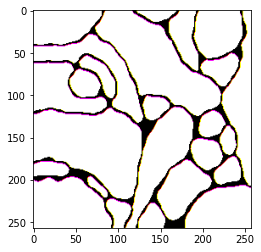

ipdb> self.dataloader.dataset
*** AttributeError: '_MultiProcessingDataLoaderIter' object has no attribute 'dataset'
ipdb> exit


BdbQuit: 

In [4]:
trnr.train()

> /n/home11/abanerjee/pytorch_connectomics/connectomics/engine/trainer.py(96)train()
     95         """
---> 96         self.model.train()
     97 

ipdb> n
> /n/home11/abanerjee/pytorch_connectomics/connectomics/engine/trainer.py(98)train()
     97 
---> 98         for i in range(self.total_iter_nums):
     99             iter_total = self.start_iter + i

ipdb> 
> /n/home11/abanerjee/pytorch_connectomics/connectomics/engine/trainer.py(99)train()
     98         for i in range(self.total_iter_nums):
---> 99             iter_total = self.start_iter + i
    100             self.start_time = time.perf_counter()

ipdb> 
> /n/home11/abanerjee/pytorch_connectomics/connectomics/engine/trainer.py(100)train()
     99             iter_total = self.start_iter + i
--> 100             self.start_time = time.perf_counter()
    101             self.optimizer.zero_grad()

ipdb> 
> /n/home11/abanerjee/pytorch_connectomics/connectomics/engine/trainer.py(101)train()
    100             self.start_time =

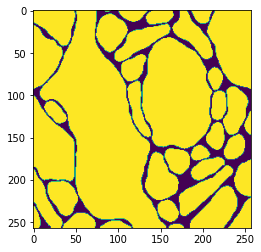

ipdb> plt.imshow(target[0][0,1,0]); plt.pause(1)


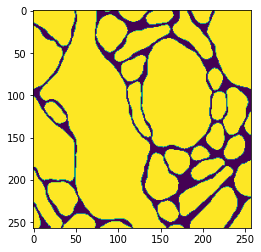

ipdb> plt.imshow(target[0][0,2,0]); plt.pause(1)


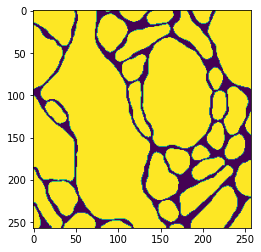

In [ ]:
trnr.train()

In [4]:
model

DataParallel(
  (module): FPN3D(
    (backbone): IntermediateLayerGetter(
      (conv1): Conv3d(1, 28, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False, padding_mode=replicate)
      (bn1): BatchNorm3d(28, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ELU(alpha=1.0, inplace=True)
      (layer0): Sequential(
        (0): InvertedResidual(
          (layers1): Sequential(
            (0): Conv3d(28, 28, kernel_size=(1, 1, 1), stride=(1, 1, 1), bias=False)
            (1): BatchNorm3d(28, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ELU(alpha=1.0, inplace=True)
            (3): Conv3d(28, 28, kernel_size=(1, 3, 3), stride=(1, 1, 1), padding=(0, 1, 1), groups=28, bias=False, padding_mode=replicate)
            (4): BatchNorm3d(28, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (5): ELU(alpha=1.0, inplace=True)
          )
          (layers2): Sequential(
            (0): C

In [1]:
%load_ext autoreload
%autoreload 2

In [ ]:
from fast_ffn.training import Trainer

In [ ]:
import torch
from fast_ffn.config import get_cfg_defaults
cfg = get_cfg_defaults()
cfg.merge_from_file('/n/home11/abanerjee/fast_ffn/configs/Fast-FFN-SNEMI3D.yaml')

In [4]:
from fast_ffn.training.dataloader import build_dataloader
dataloader = build_dataloader(cfg)

Build data dataset ===>
Image shape: (116, 1280, 1280)
Label shape: (116, 1280, 1280)
Sample size required for the augmentor: [ 35 372 372]
Total number of samples to be generated:  67755042
Build data loader ===>


In [5]:
dataloader = iter(dataloader)

/n/home11/abanerjee/.conda/envs/snemi/lib/python3.8/site-packages/torch/cuda/__init__.py:52: UserWarning: CUDA initialization: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx (Triggered internally at  /opt/conda/conda-bld/pytorch_1607369981906/work/c10/cuda/CUDAFunctions.cpp:100.)
  return torch._C._cuda_getDeviceCount() > 0


In [6]:
data = next(dataloader)

In [7]:
data.keys()

dict_keys(['image', 'label', 'seeds', 'distance'])

In [8]:
data['distance'].shape

torch.Size([1, 33, 257, 257])

In [9]:
data['image'].shape

torch.Size([1, 33, 257, 257])

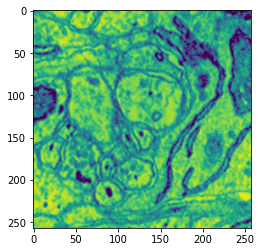

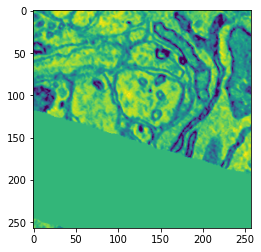

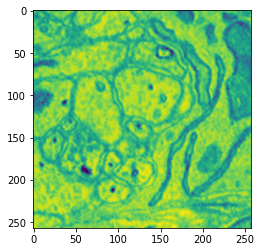

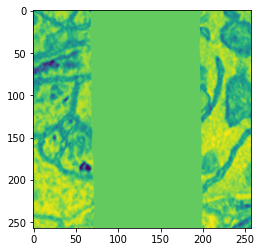

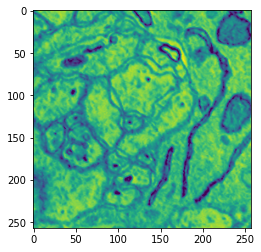

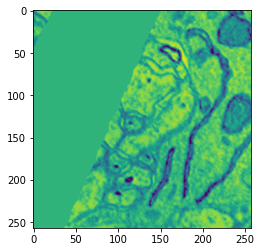

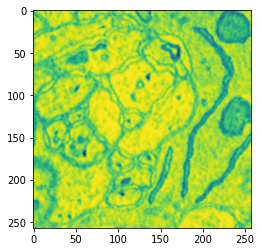

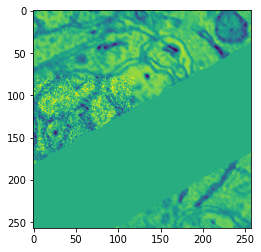

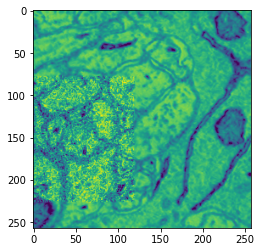

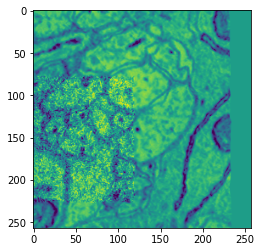

In [17]:
for i in range(10):
    plt.imshow(data['image'][0, i])
    plt.show()

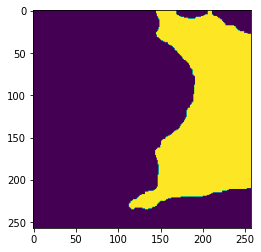

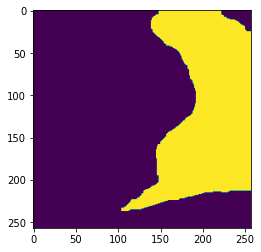

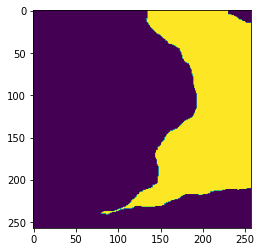

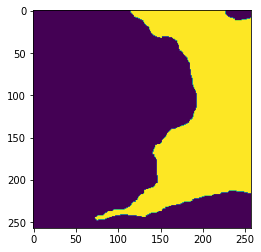

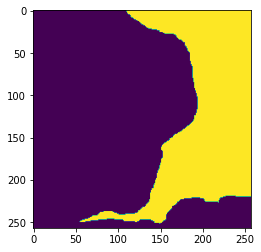

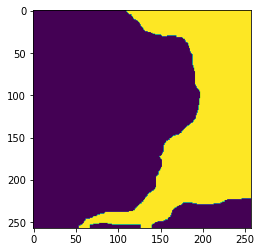

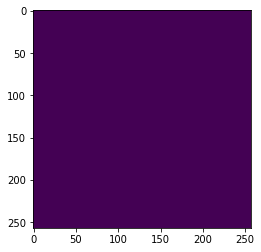

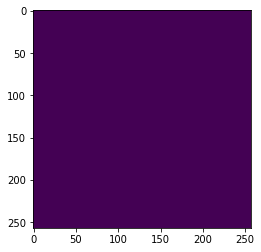

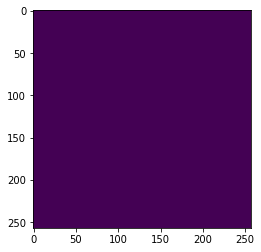

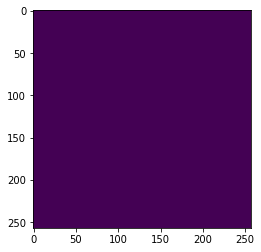

In [18]:
for i in range(10):
    plt.imshow(data['seeds'][0, i])
    plt.show()

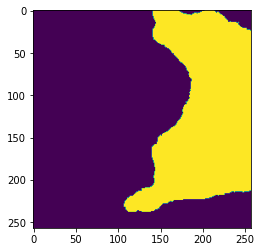

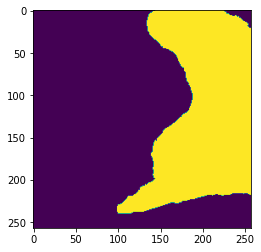

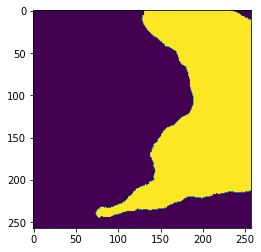

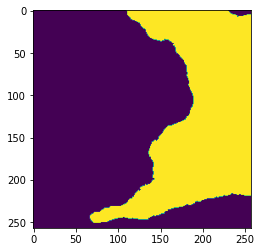

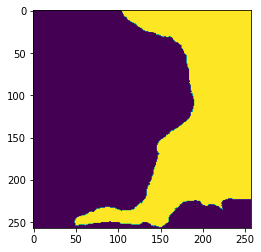

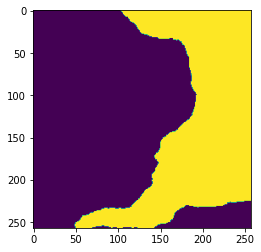

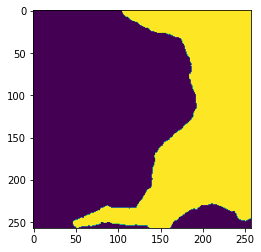

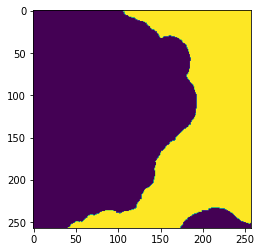

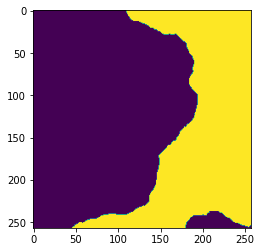

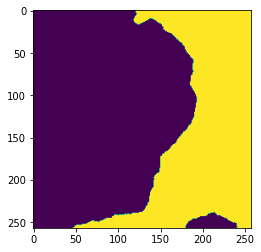

In [19]:
for i in range(10):
    plt.imshow(data['label'][0, i])
    plt.show()

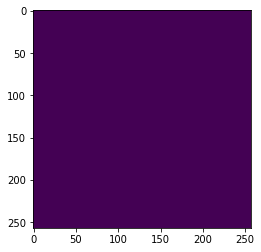

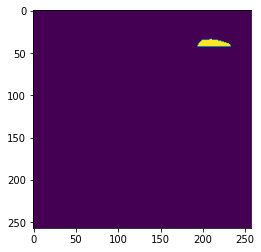

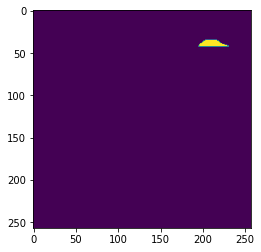

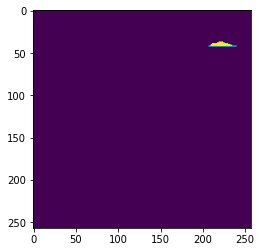

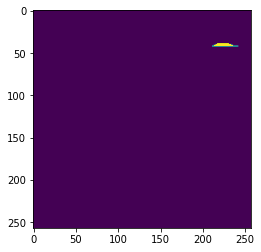

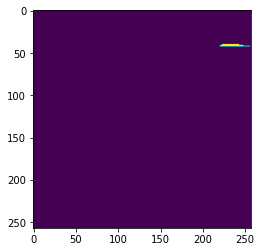

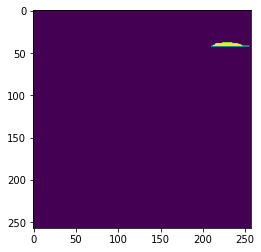

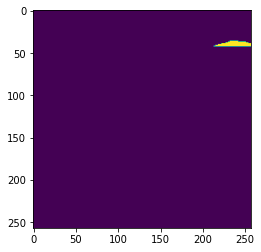

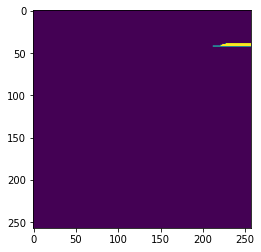

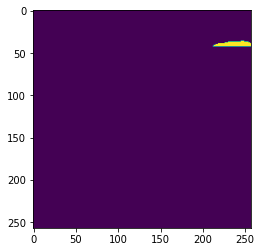

In [23]:
for i in range(10, 20):
    plt.imshow(data['seeds'][3, i])
    plt.show()

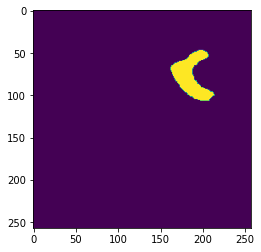

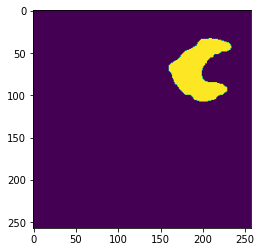

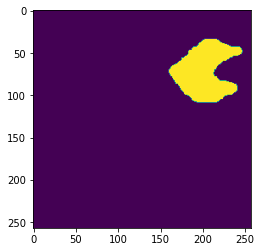

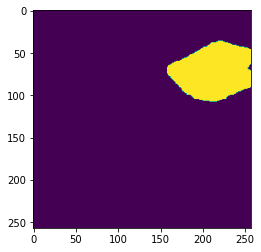

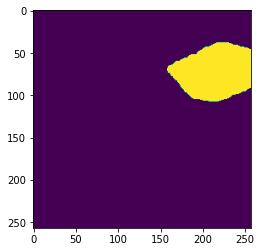

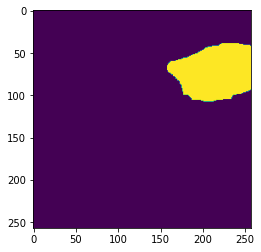

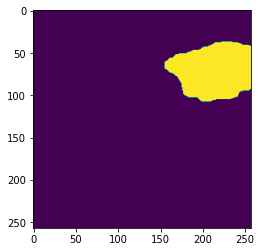

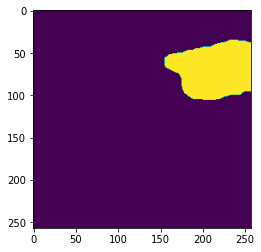

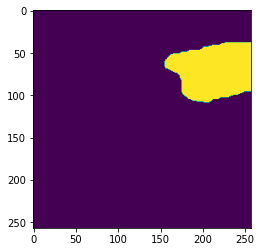

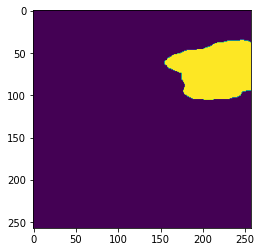

In [22]:
for i in range(10, 20):
    plt.imshow(data['label'][3, i])
    plt.show()

In [25]:
((1 - data['seeds']) - data['distance']).sum()

tensor(0.)

In [12]:
import random
random.random() # 0-1

0.5681685607011523

In [33]:
import torch
Trainer(cfg, torch.device('cpu'))

Experiment dir:  outputs/SNEMI3D/experiment_10
Full config saved to outputs/SNEMI3D/experiment_10/config.yaml
Total number of parameters:  105128
model:  FPN3D
Parallelism with DataParallel.
Optimizer:  SGD
Build data dataset ===>
Image shape: (116, 1280, 1280)
Label shape: (116, 1280, 1280)
Sample size required for the augmentor: [ 35 372 372]
Total number of samples to be generated:  190054400
Build data loader ===>


In [4]:
import torch
cfg.SYSTEM.NUM_GPUS = 0
cfg.SYSTEM.PARALLEL = 'DP'
trnr = Trainer(cfg, torch.device('cpu'), None)

Experiment dir:  outputs/SNEMI3D/experiment_10
Full config saved to outputs/SNEMI3D/experiment_10/config.yaml
Total number of parameters:  101416
model:  FPN3D
Parallelism with DataParallel.
Optimizer:  SGD
Build data dataset ===>


/n/home11/abanerjee/.conda/envs/snemi/lib/python3.8/site-packages/torch/cuda/__init__.py:52: UserWarning: CUDA initialization: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx (Triggered internally at  /opt/conda/conda-bld/pytorch_1607369981906/work/c10/cuda/CUDAFunctions.cpp:100.)
  return torch._C._cuda_getDeviceCount() > 0


Image shape: (116, 1280, 1280)
Label shape: (116, 1280, 1280)
Sample size required for the augmentor: [ 35 372 372]
Total number of samples to be generated:  67755042
Build data loader ===>


In [5]:
trnr.train()

Start training ===>
Sanity check of output sizes: 
torch.Size([1, 1, 33, 257, 257])
[Iteration 00000] Training loss: 1.21148, LR: 0.00002.
Data time: 0.3163, Forw time: 18.2265, Back time: 36.7345, Iter time: 55.2773, Avg Iter Time: 55.2773


/n/home11/abanerjee/.conda/envs/snemi/lib/python3.8/site-packages/torch/nn/functional.py:3060: UserWarning: Default upsampling behavior when mode=trilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


| ID | Name | Serial | UUID || GPU temp. | GPU util. | Memory util. || Memory total | Memory used | Memory free || Display mode | Display active |
--------------------------------------------------------------------------------------------------------------------------------------------------
[Iteration 00001] Training loss: 1.19591, LR: 0.00003.
Data time: 0.0003, Forw time: 17.4492, Back time: 33.9380, Iter time: 51.3875, Avg Iter Time: 53.3324
[Iteration 00002] Training loss: 1.03526, LR: 0.00004.
Data time: 0.0001, Forw time: 16.9635, Back time: 35.5676, Iter time: 52.5312, Avg Iter Time: 53.0653


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/n/home11/abanerjee/.conda/envs/snemi/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3418, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-5-57696dadc8f9>", line 1, in <module>
    trnr.train()
  File "/n/home11/abanerjee/fast_ffn/fast_ffn/training/trainer.py", line 85, in train
    output = self.model(inputs)
  File "/n/home11/abanerjee/.conda/envs/snemi/lib/python3.8/site-packages/torch/nn/modules/module.py", line 727, in _call_impl
    result = self.forward(*input, **kwargs)
  File "/n/home11/abanerjee/.conda/envs/snemi/lib/python3.8/site-packages/torch/nn/parallel/data_parallel.py", line 149, in forward
    return self.module(*inputs, **kwargs)
  File "/n/home11/abanerjee/.conda/envs/snemi/lib/python3.8/site-packages/torch/nn/modules/module.py", line 727, in _call_impl
    result = self.forward(*input, **kwargs)
  File "/n/home11/abanerjee/pytorch_connectomics/connectomics/model

TypeError: object of type 'NoneType' has no len()

In [12]:
%debug

> /n/home11/abanerjee/pytorch_connectomics/connectomics/model/loss/criterion.py(114)__call__()
    112             for j in range(len(self.loss_fn[i])):
    113                 w_mask = None if weight[i][j].shape[-1] == 1 else self.to_torch(weight[i][j])
--> 114                 loss_temp = self.loss_w[i][j] * self.loss_fn[i][j](
    115                             self.act[i][j](x[i]),
    116                             target=target_t,

ipdb> len(weight[0])
2
ipdb> self.loss_w
[[1.0]]
ipdb> print(i,j)
0 1
ipdb> exit


In [6]:
import torch.nn as nn

In [9]:
nn.GroupNorm(16, 32)(torch.randn(4, 32, 100, 100)).shape

torch.Size([4, 32, 100, 100])

## Inference

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from fast_ffn.training import Trainer

In [3]:
import torch
from fast_ffn.config import get_cfg_defaults
cfg = get_cfg_defaults()
cfg.merge_from_file('/n/home11/abanerjee/fast_ffn/configs/Fast-FFN-SNEMI3D.yaml')

In [4]:
path = '/n/home11/abanerjee/ffn_outs/SNEMI3D/experiment_10/checkpoint_02000.pth.tar'
from fast_ffn.inference import Runner

In [10]:
import torch
cfg.SYSTEM.NUM_GPUS = 0
cfg.SYSTEM.PARALLEL = 'DP'
runner = Runner(cfg, torch.device('cpu'), path, '')

Total number of parameters:  101416
model:  FPN3D
Parallelism with DataParallel.
Load pretrained checkpoint:  /n/home11/abanerjee/ffn_outs/SNEMI3D/experiment_10/checkpoint_02000.pth.tar
checkpoints:  dict_keys(['iteration', 'state_dict', 'optimizer', 'lr_scheduler'])
Load pretrained model weights.
Build data loader ===>
Image shape: (116, 1280, 1280)
Use test augmentation!


In [ ]:
runner.inference()

Start inference ===>
num_cores for calculating the sparse subset:  16
Total number of candiate seeds:  10003
Seeds:  [[  18  379  212]
 [  21 1080 1058]
 [  43 1186  262]
 [  69  910  171]
 [  43  200  216]
 [  96 1052  161]
 [  12 1143 1057]
 [  69 1159  216]
 [  12  845  506]
 [  12    9   65]
 [  14 1036   55]
 [  80  784  181]
 [  56 1010  521]
 [  12  770  138]
 [  94 1274  220]
 [ 105  282   37]
 [ 107  121  495]
 [  69  251  307]
 [  96  128 1207]
 [  33  306  203]
 [  56   62 1020]
 [  79 1120  729]
 [  40  726 1089]
 [  12  563  369]
 [   9 1045  108]
 [  43  802  820]
 [  12 1070 1192]
 [  56  678 1085]
 [  73  333  698]
 [  18 1005 1036]
 [  18  442  744]
 [   8 1043  966]
 [  96  380  903]
 [  33  823  822]
 [  43  995  974]
 [  96  819  926]
 [  69  903  750]
 [  56  306 1213]
 [  18  147  425]
 [  80  548  178]
 [  33  774  103]
 [  82  815 1165]
 [  12  957  250]
 [  43 1051  154]
 [  82  339   41]
 [  69  444 1110]
 [  69  952  152]
 [  84  855  430]
 [  56  672  486]
 

/n/home11/abanerjee/fast_ffn/fast_ffn/inference/seed.py:195: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  indices = unlabeled[temp_coord]


In [12]:
%debug

> /n/home11/abanerjee/fast_ffn/fast_ffn/inference/seed.py(244)__call__()
    242         selected_seeds = self.selected.copy()
    243 
--> 244         if self.selected.shape[0] > self.num_seeds:
    245             # Randomly select a subset of the seeds
    246             np.random.shuffle(selected_seeds) # in-place operation

ipdb> self.selected
[array([ 43, 147, 235]), array([ 18, 198, 655]), array([ 43, 994, 216]), array([  56,  161, 1144]), array([ 33, 125, 860]), array([  69, 1079,  723]), array([ 43, 994, 799]), array([ 69, 365, 492]), array([ 29, 687, 566]), array([ 56, 254, 790]), array([ 43, 412, 308]), array([ 56, 412, 638]), array([  43, 1189,  398]), array([  69, 1255,  896]), array([ 43, 995, 974]), array([ 18, 204, 676]), array([ 56, 255, 599]), array([  43, 1188,  170]), array([  33,  640, 1192]), array([ 56, 753, 399]), array([ 43, 994,  38]), array([ 12, 110, 742]), array([ 18, 184, 689]), array([  69, 1250, 1100]), array([ 69, 952, 104]), array([ 69, 952, 152]), ar

ipdb> len(self.selected)
10003
ipdb> torch.stack(self.selected).shape
*** NameError: name 'torch' is not defined
ipdb> import torch
ipdb> torch.stack(self.selected).shape
*** TypeError: expected Tensor as element 0 in argument 0, but got numpy.ndarray
ipdb> np
<module 'numpy' from '/n/home11/abanerjee/.conda/envs/snemi/lib/python3.8/site-packages/numpy/__init__.py'>
ipdb> np.stack(self.selected).shape
(10003, 3)
ipdb> exit


## Check inference

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from fast_ffn.training import Trainer
import h5py

In [3]:
import torch
from fast_ffn.config import get_cfg_defaults
cfg = get_cfg_defaults()
cfg.merge_from_file('/n/home11/abanerjee/fast_ffn/configs/Fast-FFN-SNEMI3D.yaml')

In [4]:
with h5py.File('/n/home11/abanerjee/ffn_outs/0029_0204_0997_result.h5', 'r') as f:
    # print(f['main'])
    data = f['main'][...]

In [5]:
import matplotlib.pyplot as plt

In [11]:
import numpy as np
np.unique(data)

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

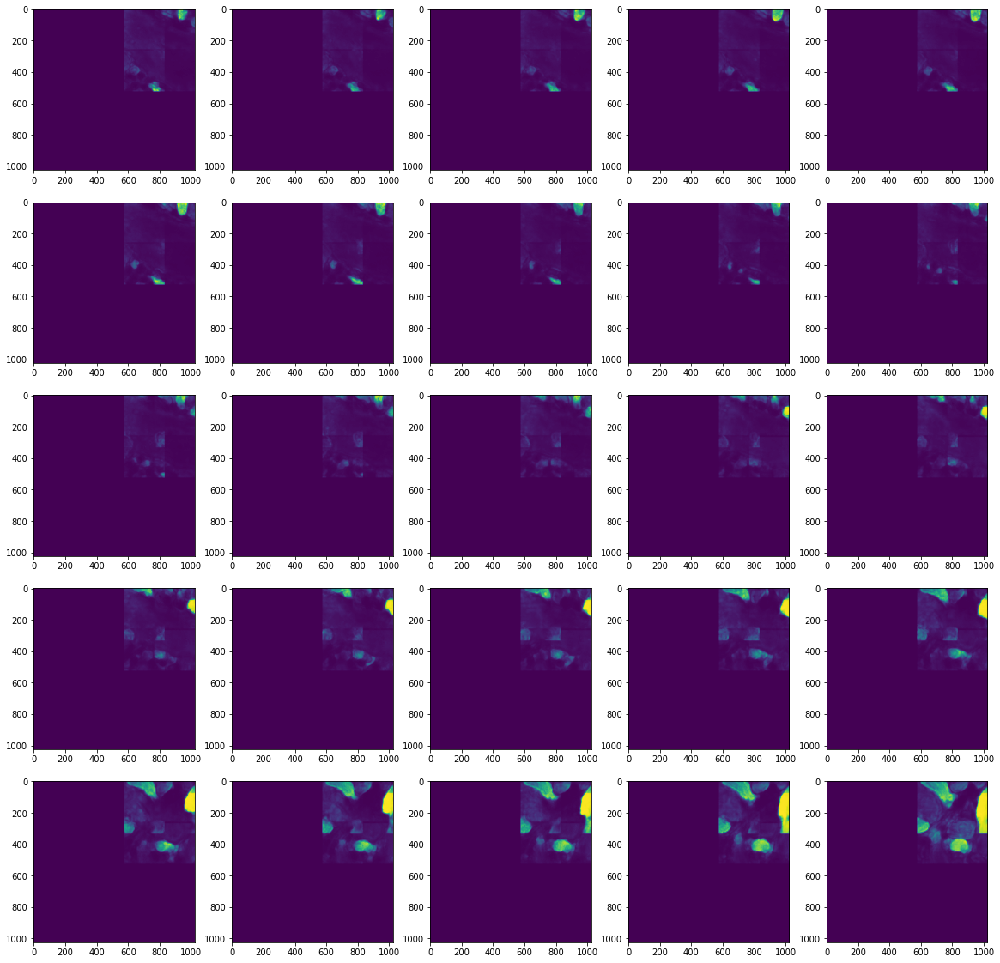

In [6]:
fig, ax = plt.subplots(5,5)
fig.set_figheight(20)
fig.set_figwidth(20)
for i in range(5):
    for j in range(5):
        ax[i,j].imshow(data[5*i + j])
plt.show()

In [7]:
with h5py.File('/n/home11/abanerjee/pytorch_connectomics/datasets/SNEMI3D/valid_image.h5', 'r') as f:
    # print(f['main'])
    image = f['main'][...]

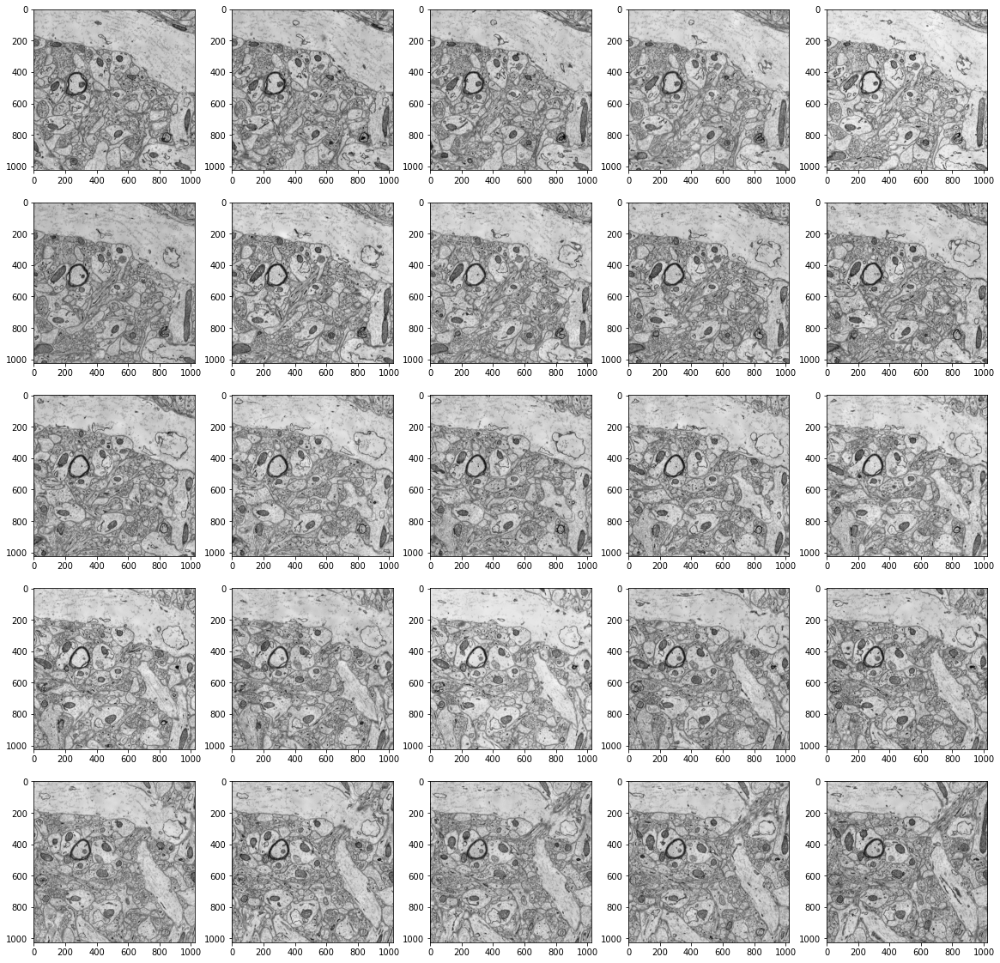

In [11]:
fig, ax = plt.subplots(5,5)
fig.set_figheight(20)
fig.set_figwidth(20)
for i in range(5):
    for j in range(5):
        ax[i,j].imshow(image[5*i + j], cmap='gray')
plt.show()
fig.savefig('/n/home11/abanerjee/val_image.png')

In [15]:
import numpy as np
np.dstack([np.zeros((100,100)),np.zeros((100,100)),np.zeros((100,100))]).shape

(100, 100, 3)

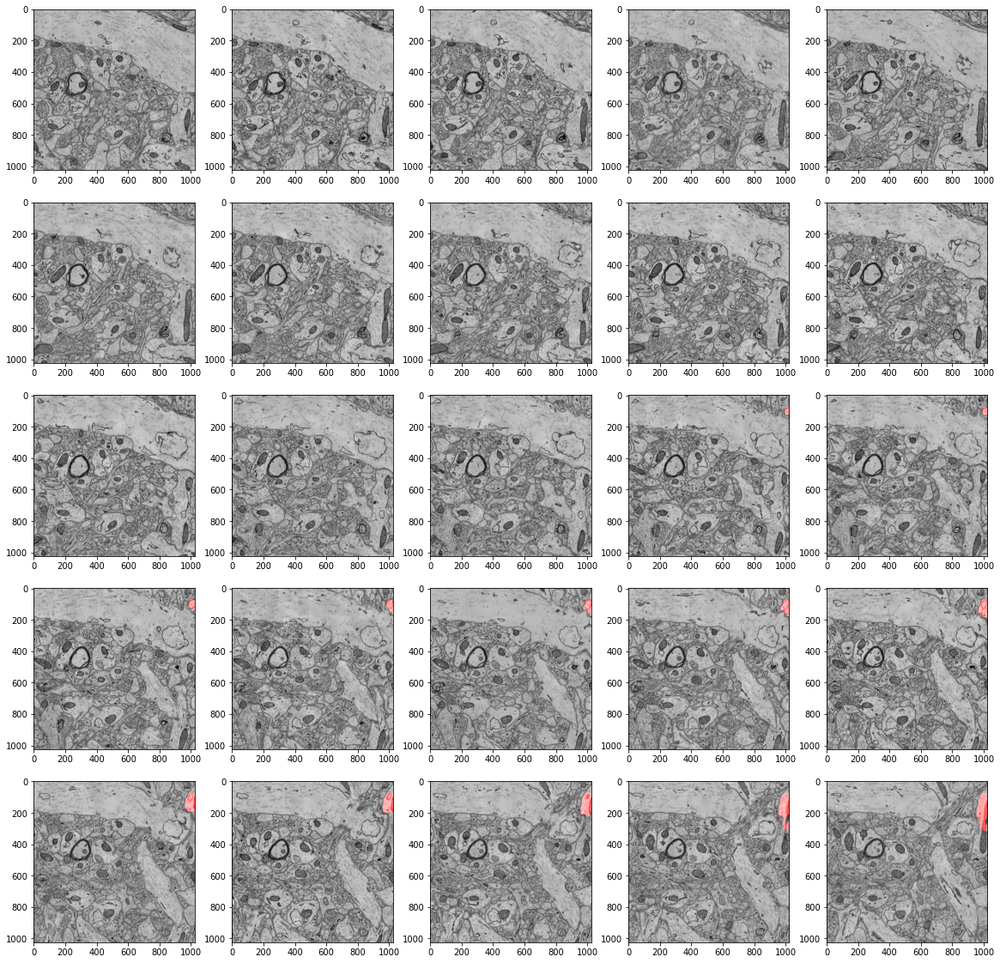

In [20]:
import numpy as np
fig, ax = plt.subplots(5,5)
fig.set_figheight(20)
fig.set_figwidth(20)
for i in range(5):
    for j in range(5):
        im_tile = image[5*i + j]
        pred_tile = 255 * (data[5*i + j] > int(cfg.INFERENCE.FOREGROUND_THRES * 255))
        viz = np.dstack([im_tile for _ in range(3)])
        mask = np.dstack([pred_tile] + [np.zeros_like(pred_tile) for _ in range(2)])
        viz = np.clip(viz + mask, a_min=0, a_max=255)
        ax[i,j].imshow(viz, cmap='gray')
plt.show()
fig.savefig('/n/home11/abanerjee/val_overlayed.png')

## Check inference

In [21]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [22]:
from fast_ffn.training import Trainer
import h5py
import matplotlib.pyplot as plt

In [28]:
with h5py.File('/n/home11/abanerjee/ffn_outs/0149_0295_0301_result.h5', 'r') as f:
    # print(f['main'])
    data = f['main'][...]

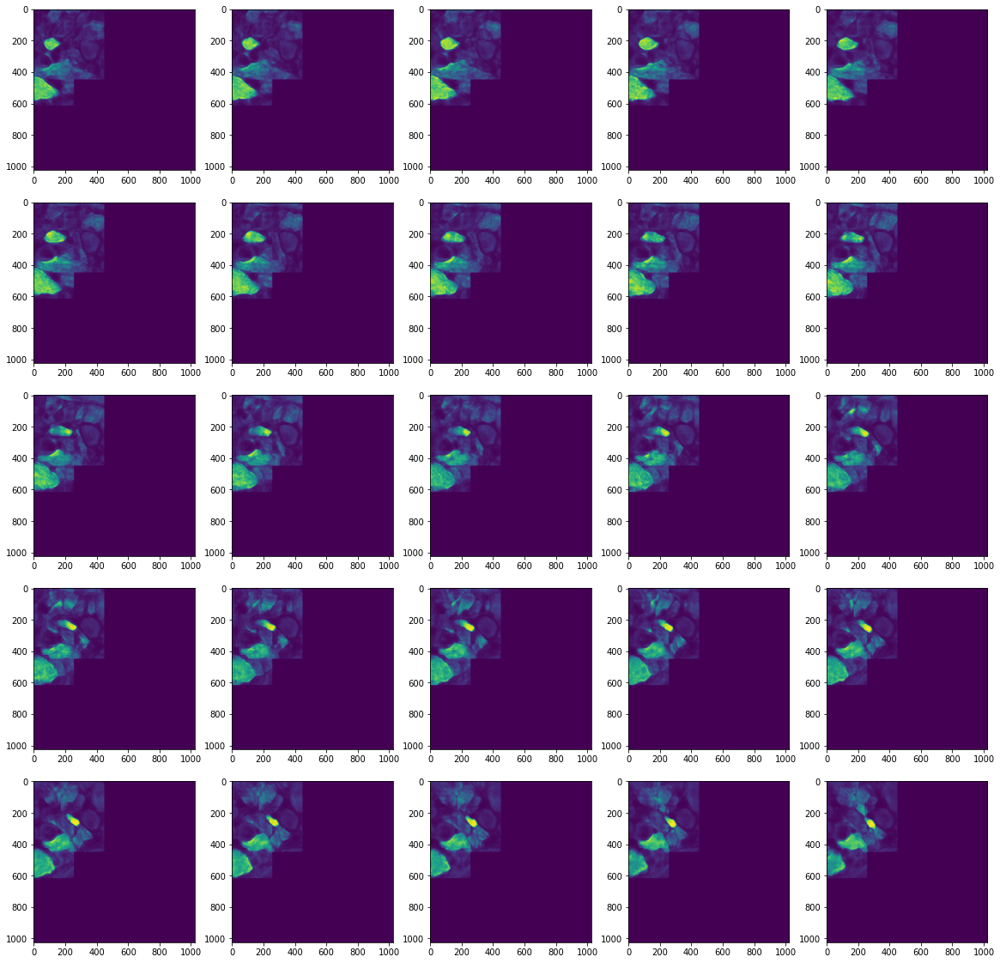

In [32]:
fig, ax = plt.subplots(5,5)
fig.set_figheight(20)
fig.set_figwidth(20)
for i in range(5):
    for j in range(5):
        ax[i,j].imshow(data[123 + 5*i + j])
plt.show()

In [25]:
with h5py.File('/n/home11/abanerjee/pytorch_connectomics/datasets/SNEMI3D/valid_image.h5', 'r') as f:
    # print(f['main'])
    image = f['main'][...]

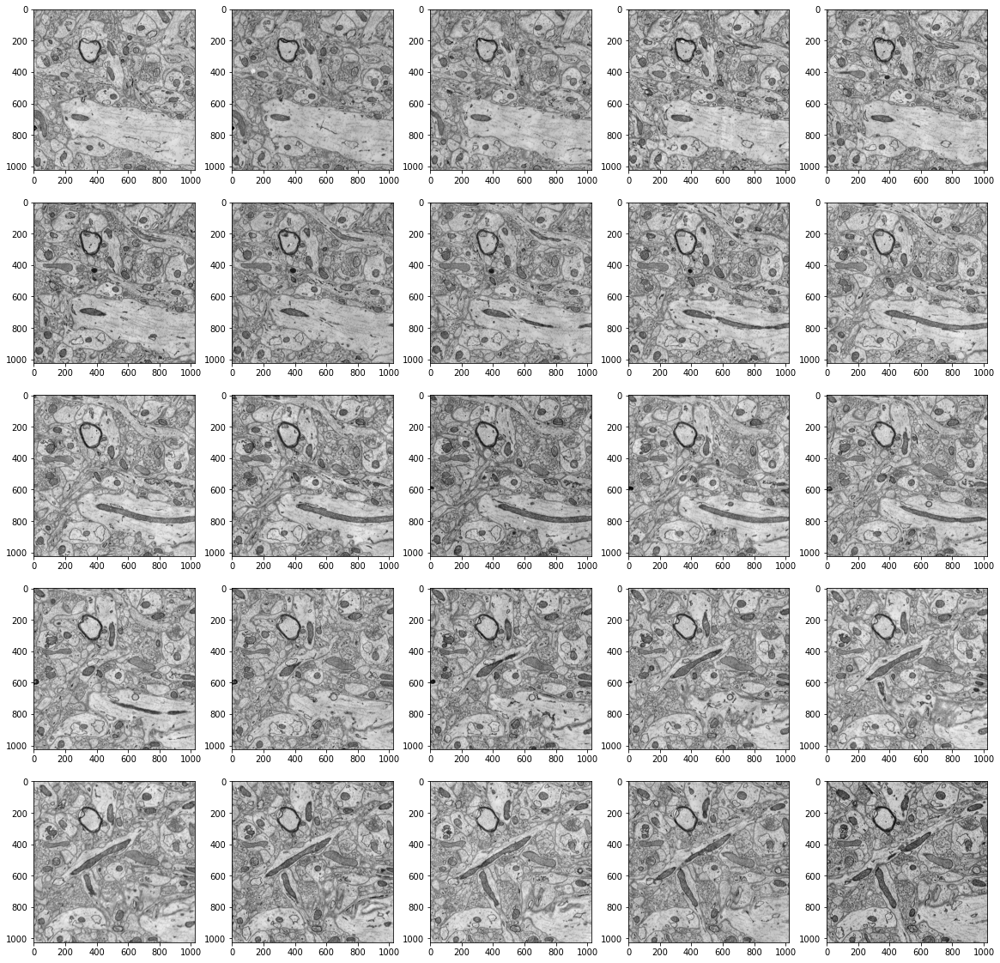

In [35]:
fig, ax = plt.subplots(5,5)
fig.set_figheight(20)
fig.set_figwidth(20)
for i in range(5):
    for j in range(5):
        ax[i,j].imshow(image[123 + 5*i + j], cmap='gray')
plt.show()

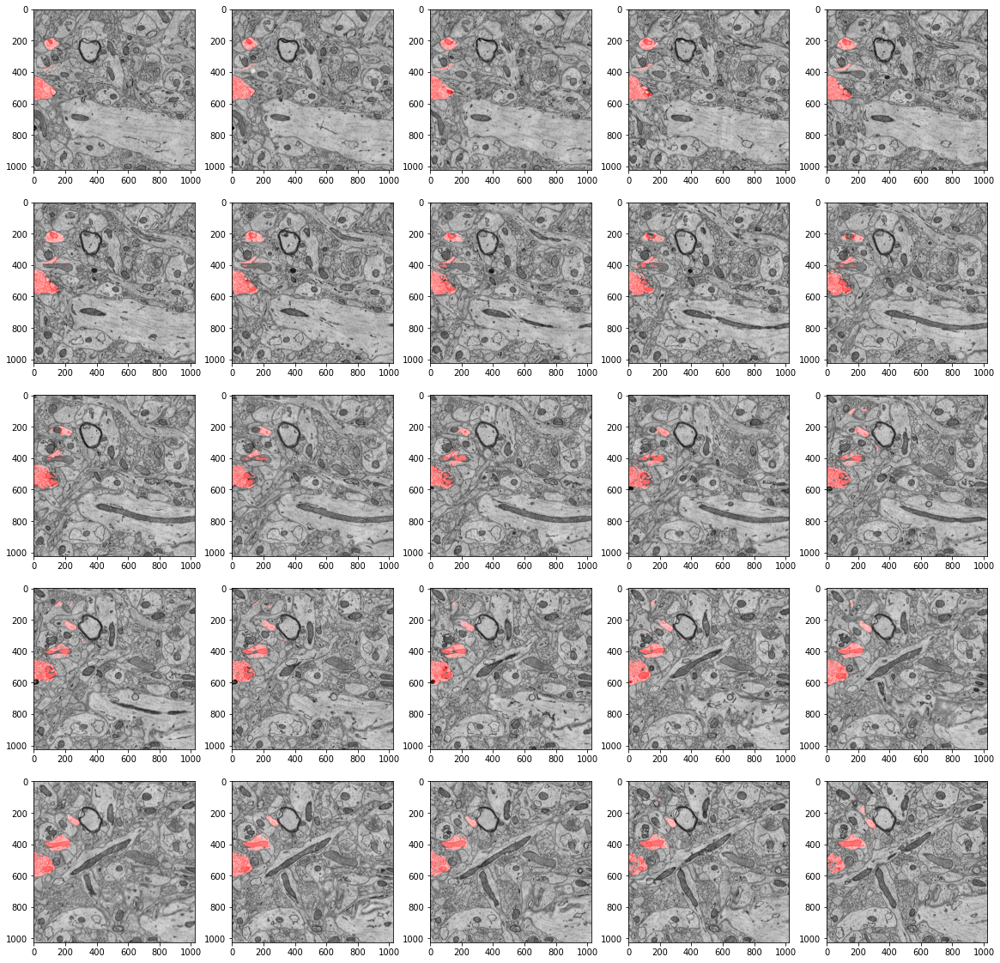

In [34]:
import numpy as np
fig, ax = plt.subplots(5,5)
fig.set_figheight(20)
fig.set_figwidth(20)
for i in range(5):
    for j in range(5):
        im_tile = image[123 + 5*i + j]
        pred_tile = 255 * (data[123 + 5*i + j] > int(0.5 * 255))
        viz = np.dstack([im_tile for _ in range(3)])
        mask = np.dstack([pred_tile] + [np.zeros_like(pred_tile) for _ in range(2)])
        viz = np.clip(viz + mask, a_min=0, a_max=255)
        ax[i,j].imshow(viz, cmap='gray')
plt.show()
# fig.savefig('/n/home11/abanerjee/val_overlayed.png')

## Numpy

In [1]:
import numpy as np

In [10]:
a = np.zeros((5,5))
a

array([[0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.]])

In [11]:
b = a[3:5,3:4]
b = np.array([2,3]).reshape(2,1)
b

array([[2],
       [3]])

In [12]:
a

array([[0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.]])

In [40]:
slc = np.s_[2:5,:,:]

In [ ]:
data = np.random.randn()

In [14]:
a = np.ones((129, 129))

In [15]:
from scipy.ndimage.morphology import distance_transform_edt
distance = distance_transform_edt(a, sampling=(6., 6.))

In [18]:
distance = np.clip(distance, a_min=0., a_max=100.)
distance = distance/100

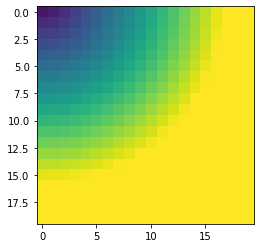

In [24]:
import matplotlib.pyplot as plt
plt.imshow(distance[:20, :20], vmin=0)

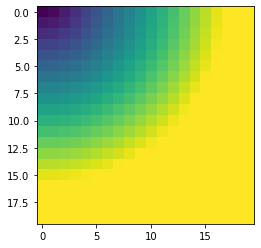

In [25]:
import matplotlib.pyplot as plt
plt.imshow(distance[:20, :20])

In [21]:
distance

array([[0.06      , 0.08485281, 0.13416408, ..., 1.        , 1.        ,
        1.        ],
       [0.12      , 0.13416408, 0.16970563, ..., 1.        , 1.        ,
        1.        ],
       [0.18      , 0.18973666, 0.21633308, ..., 1.        , 1.        ,
        1.        ],
       ...,
       [1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ],
       [1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ],
       [1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ]])

# Data preproc

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import torch
import random
import numpy as np
import h5py as h5
import imageio
import matplotlib.pyplot as plt

gt_labels = imageio.volread('/n/home11/abanerjee/pytorch_connectomics/datasets/SNEMI3D/train-labels.tif')

In [3]:
def mask_to_point(mask):
    assert mask.ndim == 3
    mask = torch.tensor(mask)
    point_cloud = torch.stack(torch.where(mask), dim=0).float()
    mean_point = point_cloud.mean(dim=-1)
    dist = ((point_cloud - mean_point.unsqueeze(-1))**2).sum(dim=0)
    centre = point_cloud[:, dist.argmin()].int()
    return tuple(centre.tolist())

# def to_int(roi):
#     return tuple([int(r) for r in roi])

In [4]:
import pickle
from tqdm.notebook import tqdm
from fast_ffn.inference.utils import adjust_boundary
from fast_ffn.inference.movement import crop_vol_roi
from fast_ffn.inference.movement import ReversibleMovementPolicy

np.random.seed(42)
random.seed(42)
policy = ReversibleMovementPolicy

# optimal_list = []
for idx in tqdm(np.unique(gt_labels)):
    optimal_moves, q, seeds = [], [], []
    if idx==0:
        continue
    sub_labels = 1. * (gt_labels == idx)
    
    candidates = np.where(gt_labels == idx)
    seed_loc = np.random.choice(candidates[0].shape[0], 1)
    seed_loc = [int(candidates[i][seed_loc]) for i in range(3)]
    
    vol_size = gt_labels.shape
    z_low, z_high = seed_loc[0] - (33 // 2), seed_loc[0] + (33 // 2) + 1
    y_low, y_high = seed_loc[1] - (257 // 2), seed_loc[1] + (257 // 2) + 1 
    x_low, x_high = seed_loc[2] - (257 // 2), seed_loc[2] + (257 // 2) + 1

    z_low, z_high = adjust_boundary(z_low, z_high, vol_size[0])
    y_low, y_high = adjust_boundary(y_low, y_high, vol_size[1])
    x_low, x_high = adjust_boundary(x_low, x_high, vol_size[2])
    roi = (z_low, z_high, y_low, y_high, x_low, x_high)
    
    cropped_mask = crop_vol_roi(sub_labels, roi)
    seed_vol = np.zeros_like(cropped_mask)
    seed_vol[seed_loc[0] - z_low, seed_loc[1] - y_low, seed_loc[2] - x_low] =  1
    
    walker = policy(np.zeros_like(gt_labels, dtype=np.uint8), 
                    connected=True, 
                    prob_thres=0.9, 
                    model_size=(33, 257, 257),
                    overlap_factor=0.25)
    walker.update_prediction(cropped_mask, roi, 1-seed_vol)
    
    cropped_mask = np.cast[bool](walker.cached_pred)
    optimal_moves.append([idx, roi, mask_to_point(cropped_mask)])
    _, new_seeds, roi_list = walker.expand_cube(roi)
    q.extend(roi_list), seeds.extend(new_seeds)
    count=1
    print(f'Index: {idx}; Roi: {count}', end='\r')
    while len(q)>0:
        while(len(seeds)>0 and seeds[0] is None):
            seeds.pop(0)
            q.pop(0)
        if len(seeds) == 0:
            break
            
        roi = q.pop(0)
        distance = 1 - seeds.pop(0)
        
        cropped_mask = crop_vol_roi(sub_labels, roi)
        walker.update_prediction(cropped_mask, roi, distance)
        
        cropped_mask = np.cast[bool](walker.cached_pred)
        optimal_moves.append([idx, roi, mask_to_point(cropped_mask)])
        
        _, new_seeds, roi_list = walker.expand_cube(roi)
        q.extend(roi_list), seeds.extend(new_seeds)
        
        count+=1
        print(f'Index: {idx}; Roi: {count}', end='\r')

    pickle.dump(optimal_moves, open(f'moves/moves_{idx}.pkl', 'wb'))
    # optimal_list.append(optimal_moves)
    print()

  0%|          | 0/401 [00:00<?, ?it/s]

Index: 1; Roi: 21
Index: 2; Roi: 29
Index: 3; Roi: 14
Index: 4; Roi: 21
Index: 5; Roi: 1
Index: 6; Roi: 85
Index: 7; Roi: 47
Index: 8; Roi: 25
Index: 9; Roi: 58
Index: 10; Roi: 103
Index: 11; Roi: 41
Index: 12; Roi: 46
Index: 13; Roi: 47
Index: 14; Roi: 41
Index: 15; Roi: 53
Index: 16; Roi: 50
Index: 17; Roi: 33
Index: 18; Roi: 48
Index: 19; Roi: 13
Index: 20; Roi: 19
Index: 21; Roi: 21
Index: 22; Roi: 21
Index: 23; Roi: 31
Index: 24; Roi: 10
Index: 25; Roi: 8
Index: 26; Roi: 7
Index: 27; Roi: 1
Index: 28; Roi: 3
Index: 29; Roi: 3
Index: 30; Roi: 2
Index: 31; Roi: 1
Index: 32; Roi: 6
Index: 33; Roi: 6
Index: 34; Roi: 9
Index: 35; Roi: 1
Index: 36; Roi: 2
Index: 37; Roi: 2
Index: 38; Roi: 2
Index: 39; Roi: 2
Index: 40; Roi: 6
Index: 41; Roi: 36
Index: 42; Roi: 36
Index: 43; Roi: 8
Index: 44; Roi: 3
Index: 45; Roi: 28
Index: 46; Roi: 14
Index: 47; Roi: 1
Index: 48; Roi: 8
Index: 49; Roi: 1
Index: 50; Roi: 1
Index: 51; Roi: 29
Index: 52; Roi: 37
Index: 53; Roi: 12
Index: 54; Roi: 23
Index

In [5]:
import glob
import pickle
from tqdm.notebook import tqdm

# with h5py.File('Moves.h5', 'w') as f:
moves = []
for file in tqdm(glob.glob('moves/*.pkl')):
    move_q = pickle.load(open(file, 'rb'))
    # idx = int(file.split('/')[1].split('_')[1].split('.')[0])
    # for i in range(len(move_q)):
    #     move_q[i] = [idx, move_q[i][0], tuple([int(n) for n in move_q[i][1]])]
    moves.append(move_q)
pickle.dump(moves, open('moves_all.pkl', 'wb'))

  0%|          | 0/400 [00:00<?, ?it/s]

In [13]:
moves[0]

[[75, (0, 33, 463, 720, 204, 461), (9, 126, 134)],
 [75, (0, 33, 463, 720, 204, 461), (9, 126, 134)],
 [75, (24, 57, 463, 720, 204, 461), (16, 128, 128)],
 [75, (0, 33, 463, 720, 12, 269), (16, 128, 128)],
 [75, (0, 33, 463, 720, 396, 653), (16, 128, 128)],
 [75, (0, 33, 463, 720, 204, 461), (9, 126, 134)],
 [75, (48, 81, 463, 720, 204, 461), (16, 128, 128)],
 [75, (24, 57, 271, 528, 204, 461), (16, 128, 128)],
 [75, (24, 57, 655, 912, 204, 461), (16, 128, 128)],
 [75, (24, 57, 463, 720, 12, 269), (16, 128, 128)],
 [75, (24, 57, 463, 720, 396, 653), (7, 142, 152)],
 [75, (0, 33, 463, 720, 12, 269), (16, 128, 128)],
 [75, (24, 57, 463, 720, 12, 269), (16, 128, 128)],
 [75, (0, 33, 271, 528, 12, 269), (16, 128, 128)],
 [75, (0, 33, 655, 912, 12, 269), (16, 128, 128)],
 [75, (0, 33, 463, 720, 0, 257), (16, 128, 128)],
 [75, (0, 33, 463, 720, 204, 461), (9, 126, 134)],
 [75, (0, 33, 463, 720, 396, 653), (16, 128, 128)],
 [75, (24, 57, 463, 720, 396, 653), (7, 142, 152)],
 [75, (0, 33, 271,

In [14]:
from itertools import chain

itr = chain.from_iterable(moves)
next(itr)
next(itr)

[75, (0, 33, 463, 720, 204, 461), (9, 126, 134)]

In [1]:
%load_ext autoreload
%autoreload 2

In [ ]:
import torch
import random
import math
import numpy as np
import h5py as h5
import imageio
import matplotlib.pyplot as plt
import pickle
from tqdm.notebook import tqdm
from itertools import chain, cycle
from fast_ffn.config import get_cfg_defaults
from fast_ffn.training.dataloader.dataset import PrecomputedDataset
from fast_ffn.training.dataloader.build import build_dataloader
from connectomics.data.augmentation import build_train_augmentor

gt_labels = imageio.volread('/n/home11/abanerjee/pytorch_connectomics/datasets/SNEMI3D/train-labels.tif')
vol = imageio.volread('/n/home11/abanerjee/pytorch_connectomics/datasets/SNEMI3D/train-input.tif')
moves = pickle.load(open('moves_all.pkl','rb'))
cfg = get_cfg_defaults()
cfg.merge_from_file('/n/home11/abanerjee/fast_ffn/configs/Fast-FFN-SNEMI3D.yaml')
augmentor, copy_paste_augmentor = build_train_augmentor(cfg)

def worker_init_fn(worker_id):
    worker_info = torch.utils.data.get_worker_info()
    dataset = worker_info.dataset 
    per_worker = math.ceil(len(dataset.moves)/worker_info.num_workers)
    start,end = worker_id * per_worker, min(len(dataset.moves), (worker_id+1) * per_worker)
    dataset.moves = dataset.moves[start:end]

In [3]:
ds = PrecomputedDataset(cfg,[vol],[gt_labels],moves,augmentor,copy_paste_augmentor)
dl = torch.utils.data.DataLoader(ds,
                                 batch_size=cfg.SOLVER.SAMPLES_PER_BATCH, worker_init_fn=worker_init_fn,
                                 num_workers=cfg.DATA_LOADER.NUM_WORKERS, pin_memory=True)

Using copy paste augmentation


In [4]:
loader = build_dataloader(cfg, True)

Build data dataset ===>
Image shape: (100, 1024, 1024)
Label shape: (100, 1024, 1024)
Sample size required for the augmentor: [ 35 372 372]
Using copy paste augmentation
Build data loader ===>


In [6]:
for _ in range(10):
    move = next(iter(loader))

In [8]:
augmentor.transforms

In [17]:
cfg.freeze()
if cfg.SOLVER.is_frozen(): cfg.SOLVER.defrost()
cfg.SOLVER.MAX_ITER = 100

In [4]:
idl = iter(dl)

/n/home11/abanerjee/.conda/envs/snemi/lib/python3.8/site-packages/torch/cuda/__init__.py:52: UserWarning: CUDA initialization: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx (Triggered internally at  /opt/conda/conda-bld/pytorch_1607369981906/work/c10/cuda/CUDAFunctions.cpp:100.)
  return torch._C._cuda_getDeviceCount() > 0


out sum: (275, (61, 94, 0, 257, 101, 358), (11, 158, 136), 121819, 121819, 0.0)



In [5]:
for i in range(10):
    next(idl)

In [4]:
move = next(iter(loader))

used copy paste
[160, (67, 100, 387, 644, 687, 944), (17, 143, 158)]

used copy paste
used copy paste
used copy paste
[276, (47, 80, 499, 756, 240, 497), (20, 133, 98)]
used copy paste
[138, (50, 83, 767, 1024, 498, 755), (19, 242, 156)]

[75, (0, 33, 463, 720, 204, 461), (9, 126, 134)]

used copy paste

[136, (67, 100, 767, 1024, 304, 561), (29, 229, 190)][189, (29, 62, 316, 573, 169, 426), (16, 106, 130)]used copy paste

used copy paste



[35, (0, 33, 377, 634, 0, 257), (7, 101, 37)]

[96, (67, 100, 409, 666, 372, 629), (17, 139, 122)]



Exception: Caught Exception in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/n/home11/abanerjee/fast_ffn/fast_ffn/training/dataloader/dataset.py", line 271, in process_move
    seed_mask, distance = self.sample_seed(out_label)
  File "/n/home11/abanerjee/fast_ffn/fast_ffn/training/dataloader/dataset.py", line 303, in sample_seed
    seed_pos = np.random.randint(0, len(candidates[0]))
  File "mtrand.pyx", line 746, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1254, in numpy.random._bounded_integers._rand_int64
ValueError: low >= high

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/n/home11/abanerjee/.conda/envs/snemi/lib/python3.8/site-packages/torch/utils/data/_utils/worker.py", line 198, in _worker_loop
    data = fetcher.fetch(index)
  File "/n/home11/abanerjee/.conda/envs/snemi/lib/python3.8/site-packages/torch/utils/data/_utils/fetch.py", line 28, in fetch
    data.append(next(self.dataset_iter))
  File "/n/home11/abanerjee/fast_ffn/fast_ffn/training/dataloader/dataset.py", line 275, in process_move
    raise Exception('Seed').with_traceback(e.__traceback__)
  File "/n/home11/abanerjee/fast_ffn/fast_ffn/training/dataloader/dataset.py", line 271, in process_move
    seed_mask, distance = self.sample_seed(out_label)
  File "/n/home11/abanerjee/fast_ffn/fast_ffn/training/dataloader/dataset.py", line 303, in sample_seed
    seed_pos = np.random.randint(0, len(candidates[0]))
  File "mtrand.pyx", line 746, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1254, in numpy.random._bounded_integers._rand_int64
Exception: Seed


used copy paste
[117, (53, 86, 236, 493, 668, 925), (16, 115, 147)]

used copy paste
[172, (36, 69, 553, 810, 0, 257), (20, 133, 35)]used copy paste
used copy paste
[275, (61, 94, 0, 257, 101, 358), (11, 158, 136)]



[339, (67, 100, 0, 257, 409, 666), (25, 25, 84)]

used copy paste
[164, (38, 71, 598, 855, 104, 361), (17, 119, 158)]

used copy paste
[147, (33, 66, 659, 916, 767, 1024), (15, 120, 150)]

used copy paste
[14, (4, 37, 322, 579, 750, 1007), (14, 135, 79)]

used copy paste
[99, (31, 64, 123, 380, 0, 257), (8, 118, 44)]

used copy paste
[134, (0, 33, 0, 257, 98, 355), (5, 52, 164)]



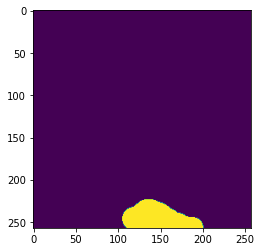

In [5]:
plt.imshow((gt_labels[50:83, 767:1024, 498:755] == 138)[19])

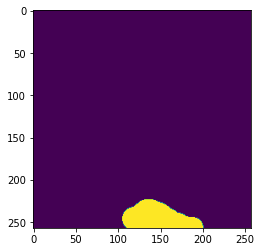

In [6]:
from fast_ffn.inference.movement import crop_vol_roi
plt.imshow((crop_vol_roi(gt_labels, (50,83,767,1024,498,755)) == 138).astype(np.uint8)[19])

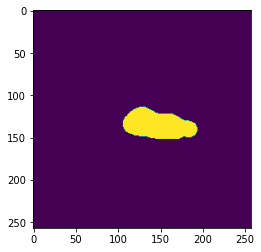

In [5]:
plt.imshow((gt_labels[67:100, 387:644, 687:944] == 160)[17])

In [5]:
from fast_ffn.inference.movement import keep_connected
vol = (gt_labels[67:100, 387:644, 687:944] == 160).astype(np.uint8)
dist = np.ones_like(vol)
dist[(17, 143, 158)] = 0
conn = keep_connected(vol, dist)

In [6]:
conn.sum()

59204

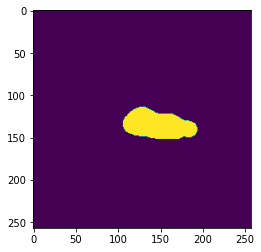

In [25]:
plt.imshow(conn[17])

In [8]:
np.concatenate([gt_labels]).shape

(100, 1024, 1024)

In [6]:
(gt_labels[67:100, 387:644, 687:944] == 160)[17, 143, 158]

True

In [6]:
moves

[[[75, (0, 33, 463, 720, 204, 461), (9, 126, 134)],
  [75, (24, 57, 463, 720, 204, 461), (2, 140, 231)],
  [75, (0, 33, 463, 720, 12, 269), (2, 118, 242)],
  [75, (0, 33, 463, 720, 396, 653), (28, 139, 125)],
  [75, (24, 57, 463, 720, 396, 653), (7, 142, 152)],
  [75, (0, 33, 463, 720, 588, 845), (31, 174, 73)],
  [75, (24, 57, 463, 720, 588, 845), (10, 182, 101)],
  [75, (24, 57, 463, 720, 588, 845), (10, 182, 101)],
  [75, (0, 33, 655, 912, 588, 845), (31, 6, 134)],
  [75, (0, 33, 463, 720, 767, 1024), (32, 206, 4)],
  [75, (24, 57, 655, 912, 588, 845), (11, 15, 177)],
  [75, (24, 57, 463, 720, 767, 1024), (10, 224, 108)],
  [75, (0, 33, 463, 720, 767, 1024), (31, 241, 221)],
  [75, (24, 57, 655, 912, 767, 1024), (10, 32, 108)]],
 [[172, (36, 69, 553, 810, 0, 257), (20, 133, 35)],
  [172, (12, 45, 553, 810, 0, 257), (32, 117, 4)],
  [172, (60, 93, 553, 810, 0, 257), (21, 192, 148)],
  [172, (67, 100, 553, 810, 0, 257), (20, 207, 173)],
  [172, (60, 93, 745, 1002, 0, 257), (28, 18, 18

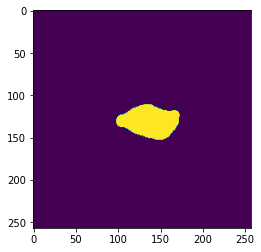

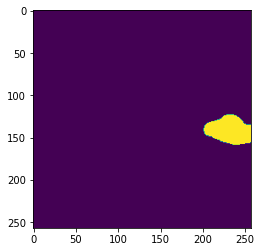

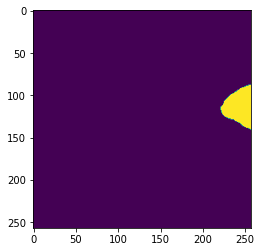

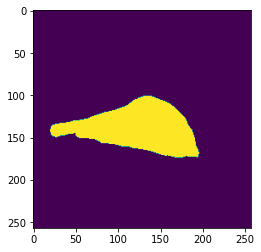

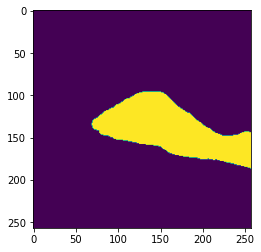

...

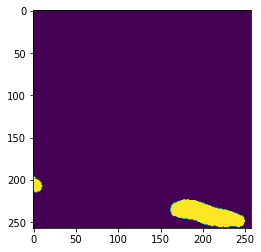

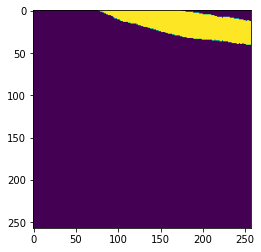

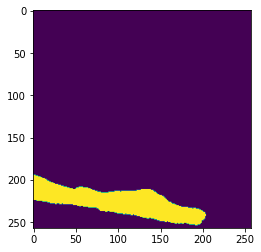

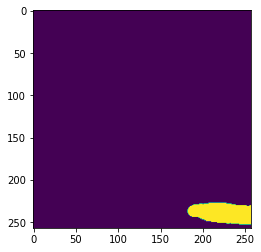

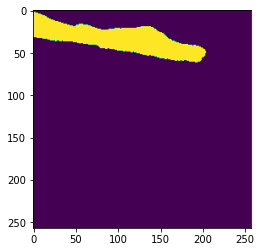

In [10]:
for idx,roi, point in moves[0]:
    z1,z2,y1,y2,x1,x2 = roi
    crop = gt_labels[z1:z2,y1:y2,x1:x2]==idx
    plt.imshow(crop[point[0]])
    plt.show()

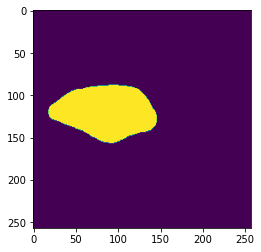

In [9]:
plt.imshow(move['label'][0,0])

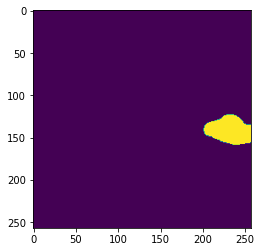

In [7]:
plt.imshow((gt_labels[24:57, 463:720, 204:461] == 75)[2])

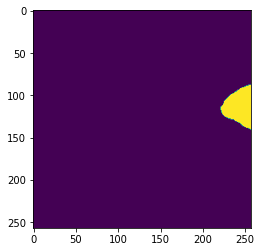

In [8]:
plt.imshow((gt_labels[:33, 463:720, 12:269] == 75)[2])

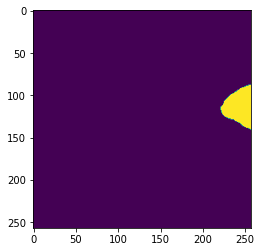

In [8]:
plt.imshow((gt_labels[:33, 463:720, 12:269] == 75)[2])

In [13]:
for i in tqdm(range(50)):
    next(loader)

  0%|          | 0/50 [00:00<?, ?it/s]

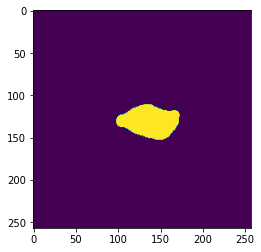

In [19]:
plt.imshow((gt_labels[:33, 463:720, 204:461] == 75)[9])

In [20]:
(gt_labels[:33, 463:720, 204:461] == 75)[9, 124:128, 132:136]

Array([[ True,  True,  True,  True],
       [ True,  True,  True,  True],
       [ True,  True,  True,  True],
       [ True,  True,  True,  True]])

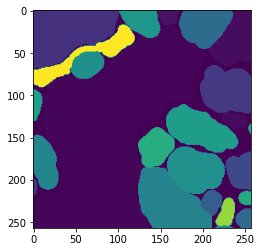

In [10]:
plt.imshow((gt_labels[24:57, 463:720, 204:461])[16])

In [31]:
import pickle
from tqdm.notebook import tqdm
from fast_ffn.inference.utils import adjust_boundary
from fast_ffn.inference.movement import crop_vol_roi
from fast_ffn.inference.movement import ReversibleMovementPolicy

np.random.seed(42)
random.seed(42)
policy = ReversibleMovementPolicy

def mask_to_point(mask):
    assert mask.ndim == 3
    mask = torch.tensor(mask)
    point_cloud = torch.stack(torch.where(mask), dim=0).float()
    mean_point = point_cloud.mean(dim=-1)
    dist = ((point_cloud - mean_point.unsqueeze(-1))**2).sum(dim=0)
    centre = point_cloud[:, dist.argmin()].int()
    return tuple(centre.tolist())

def trace():
    
    optimal_moves, q, seeds = [], [], []

    sub_labels = 1. * (gt_labels == 75)

    vol_size = gt_labels.shape
    roi = (z_low, z_high, y_low, y_high, x_low, x_high) = (0, 33, 463, 720, 204, 461)
    seed_loc = (9, 126, 134)

    cropped_mask = crop_vol_roi(sub_labels, roi)
    seed_vol = np.zeros_like(cropped_mask)
    seed_vol[seed_loc[0], seed_loc[1], seed_loc[2]] =  1

    walker = policy(np.zeros_like(gt_labels, dtype=np.uint8), 
                    connected=True, 
                    prob_thres=0.9, 
                    model_size=(33, 257, 257),
                    overlap_factor=0.25)
    walker.update_prediction(cropped_mask, roi, 1-seed_vol)

    cropped_mask = np.cast[bool](walker.cached_pred)
    optimal_moves.append([75, roi, mask_to_point(cropped_mask)])
    _, new_seeds, roi_list = walker.expand_cube(roi)
    q.extend(roi_list), seeds.extend(new_seeds)
    # import ipdb; ipdb.set_trace()
    count=1
    while len(q)>0:
        while(len(seeds)>0 and seeds[0] is None):
            seeds.pop(0)
            q.pop(0)
        if len(seeds) == 0:
            break

        roi = q.pop(0)
        distance = 1 - seeds.pop(0)

        cropped_mask = crop_vol_roi(sub_labels, roi)
        walker.update_prediction(cropped_mask, roi, distance)

        cropped_mask = np.cast[bool](walker.cached_pred)
        optimal_moves.append([75, roi, mask_to_point(cropped_mask)])

        _, new_seeds, roi_list = walker.expand_cube(roi)
        q.extend(roi_list), seeds.extend(new_seeds)

        print(f'Index: 75; Roi: {count}', end='\r')
        count+=1
    return optimal_moves

# pickle.dump(optimal_moves, open(f'moves/moves_{idx}.pkl', 'wb'))
# optimal_list.append(optimal_moves)
# print()
trace()

[[75, (0, 33, 463, 720, 204, 461), (9, 126, 134)],
 [75, (24, 57, 463, 720, 204, 461), (2, 140, 231)],
 [75, (0, 33, 463, 720, 12, 269), (2, 118, 242)],
 [75, (0, 33, 463, 720, 396, 653), (28, 139, 125)],
 [75, (24, 57, 463, 720, 396, 653), (7, 142, 152)],
 [75, (0, 33, 463, 720, 588, 845), (31, 174, 73)],
 [75, (24, 57, 463, 720, 588, 845), (10, 182, 101)],
 [75, (24, 57, 463, 720, 588, 845), (10, 182, 101)],
 [75, (0, 33, 655, 912, 588, 845), (31, 6, 134)],
 [75, (24, 57, 655, 912, 588, 845), (11, 15, 177)],
 [75, (24, 57, 463, 720, 767, 1024), (10, 224, 108)],
 [75, (0, 33, 463, 720, 767, 1024), (31, 241, 221)],
 [75, (24, 57, 655, 912, 767, 1024), (10, 32, 108)]]

In [11]:
moves[0]

[[75, (0, 33, 463, 720, 204, 461), (9, 126, 134)],
 [75, (0, 33, 463, 720, 204, 461), (9, 126, 134)],
 [75, (24, 57, 463, 720, 204, 461), (16, 128, 128)],
 [75, (0, 33, 463, 720, 12, 269), (16, 128, 128)],
 [75, (0, 33, 463, 720, 396, 653), (16, 128, 128)],
 [75, (0, 33, 463, 720, 204, 461), (9, 126, 134)],
 [75, (48, 81, 463, 720, 204, 461), (16, 128, 128)],
 [75, (24, 57, 271, 528, 204, 461), (16, 128, 128)],
 [75, (24, 57, 655, 912, 204, 461), (16, 128, 128)],
 [75, (24, 57, 463, 720, 12, 269), (16, 128, 128)],
 [75, (24, 57, 463, 720, 396, 653), (7, 142, 152)],
 [75, (0, 33, 463, 720, 12, 269), (16, 128, 128)],
 [75, (24, 57, 463, 720, 12, 269), (16, 128, 128)],
 [75, (0, 33, 271, 528, 12, 269), (16, 128, 128)],
 [75, (0, 33, 655, 912, 12, 269), (16, 128, 128)],
 [75, (0, 33, 463, 720, 0, 257), (16, 128, 128)],
 [75, (0, 33, 463, 720, 204, 461), (9, 126, 134)],
 [75, (0, 33, 463, 720, 396, 653), (16, 128, 128)],
 [75, (24, 57, 463, 720, 396, 653), (7, 142, 152)],
 [75, (0, 33, 271,

In [12]:
moves[1]

[[172, (36, 69, 553, 810, 0, 257), (20, 133, 35)],
 [172, (60, 93, 553, 810, 0, 257), (16, 127, 128)],
 [172, (36, 69, 553, 810, 0, 257), (20, 133, 35)],
 [172, (67, 100, 553, 810, 0, 257), (16, 126, 127)],
 [172, (60, 93, 361, 618, 0, 257), (16, 128, 128)],
 [172, (60, 93, 745, 1002, 0, 257), (16, 129, 127)],
 [172, (60, 93, 553, 810, 0, 257), (16, 127, 128)],
 [172, (60, 93, 553, 810, 192, 449), (16, 128, 128)],
 [172, (67, 100, 553, 810, 0, 257), (16, 126, 127)],
 [172, (67, 100, 361, 618, 0, 257), (16, 128, 128)],
 [172, (67, 100, 745, 1002, 0, 257), (16, 130, 127)],
 [172, (67, 100, 553, 810, 0, 257), (16, 126, 127)],
 [172, (67, 100, 553, 810, 192, 449), (16, 127, 129)],
 [172, (36, 69, 361, 618, 0, 257), (16, 128, 128)],
 [172, (67, 100, 361, 618, 0, 257), (16, 128, 128)],
 [172, (60, 93, 169, 426, 0, 257), (16, 128, 128)],
 [172, (60, 93, 361, 618, 0, 257), (16, 128, 128)],
 [172, (60, 93, 361, 618, 192, 449), (16, 128, 128)],
 [172, (36, 69, 745, 1002, 0, 257), (16, 128, 128)]

In [10]:
for i in tqdm(range(100)):
    move = next(loader)

  0%|          | 0/100 [00:00<?, ?it/s]

ValueError: Caught ValueError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/n/home11/abanerjee/.conda/envs/snemi/lib/python3.8/site-packages/torch/utils/data/_utils/worker.py", line 198, in _worker_loop
    data = fetcher.fetch(index)
  File "/n/home11/abanerjee/.conda/envs/snemi/lib/python3.8/site-packages/torch/utils/data/_utils/fetch.py", line 28, in fetch
    data.append(next(self.dataset_iter))
  File "/n/home11/abanerjee/fast_ffn/fast_ffn/training/dataloader/dataset.py", line 270, in process_move
    seed_mask, distance = self.sample_seed(out_label)
  File "/n/home11/abanerjee/fast_ffn/fast_ffn/training/dataloader/dataset.py", line 298, in sample_seed
    seed_pos = np.random.randint(0, len(candidates[0]))
  File "mtrand.pyx", line 746, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1254, in numpy.random._bounded_integers._rand_int64
ValueError: low >= high


In [6]:
for i in tqdm(range(100000)):
    move = next(loader)
    if move['end']:
        print(i)
        break

  0%|          | 0/100000 [00:00<?, ?it/s]

518


In [8]:
move['label'].shape

torch.Size([1, 33, 257, 257])

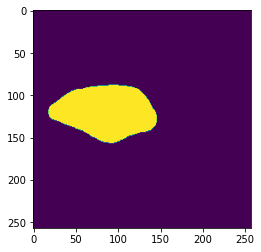

In [10]:
plt.imshow(move['label'][0,0])

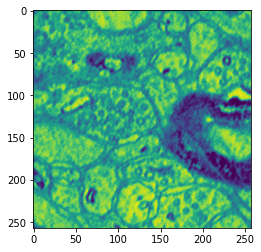

In [11]:
plt.imshow(move['image'][0,0])

In [9]:
for m in move:
    print(m)

tensor([75])
[tensor([0]), tensor([33]), tensor([463]), tensor([720]), tensor([204]), tensor([461])]
[tensor([9]), tensor([126]), tensor([134])]


In [10]:
idx, roi, point_on_target = move

In [9]:
chain = chain.from_iterable(cycle(moves))

In [10]:
next(chain)

[75, (0, 33, 463, 720, 204, 461), (9, 126, 134)]

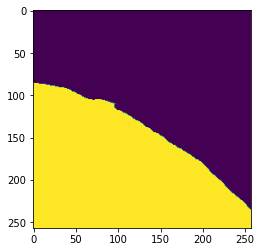

In [17]:
plt.imshow(cropped_mask[15])

In [16]:
mask_centre

(tensor(15, dtype=torch.int32),
 tensor(192, dtype=torch.int32),
 tensor(100, dtype=torch.int32))

In [44]:
import pickle
pickle.dump(optimal_moves, open(f'moves_{idx}.pkl', 'wb'))

In [39]:
optimal_moves[0][1]

array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1]],

       ...,

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [1, 1, 1, ..., 0, 0, 0],
        [1, 1, 1, ..., 0, 0, 0],
        [1, 1, 1, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [1, 1, 1, ..., 

In [21]:
np.unique(sub_labels)

Array([0., 1.])

In [24]:
np.unique(walker.pred_mask)

array([0.], dtype=float32)

In [26]:
pre_cm = crop_vol_roi(sub_labels, roi)
np.unique(pre_cm)

Array([0., 1.])

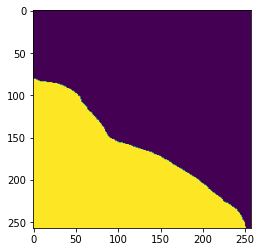

In [33]:
plt.imshow(pre_cm[16])

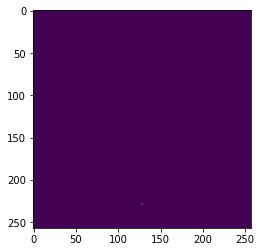

In [32]:
plt.imshow(seed_vol[16])

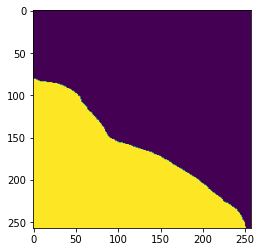

In [37]:
plt.imshow(cropped_mask[16])

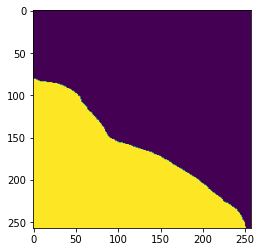

In [35]:
from fast_ffn.inference.movement import keep_connected

plt.imshow(keep_connected(pre_cm, 1-seed_vol, )[16])

In [15]:
np.unique(optimal_moves[-1][1])

array([1], dtype=uint16)

In [ ]:
walker = policy(np.zeros_like(gt_labels, dtype=np.uint8), 
                    connected=True, 
                    prob_thres=1., 
                    model_size=(33, 257, 257),
                    overlap_factor=0.25)
walker.update_prediction(cropped_mask, roi, 1-seed_vol)

In [17]:
cropped_mask = crop_vol_roi(sub_labels, roi)

In [25]:
np.unique(cropped_mask)

array([1], dtype=uint16)

In [20]:
roi

(66, 99, 0, 257, 767, 1024)

In [16]:
seed_vol

Array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       ...,

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0.

In [9]:
%debug

> /n/home11/abanerjee/fast_ffn/fast_ffn/inference/movement.py(22)keep_connected()
     20     """
     21     seed = (distance==0).astype(int)
---> 22     assert seed.sum() > 0, "The seed mask needs to contain at least one pixel!"
     23     # pred = output.sigmoid().detach().cpu().squeeze().numpy()
     24     pred = (pred > foreground_thres).astype(np.uint8)

ipdb> seed.shape
(33, 257, 257)
ipdb> np.unique(seed)
Array([0])
ipdb> exit


In [14]:
import torch
from kornia.morphology import erosion
import matplotlib.pyplot as plt

In [15]:
arr = torch.zeros(224,224)
arr[50:, 50:] = 1.

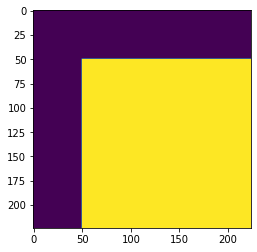

In [16]:
plt.imshow(arr)

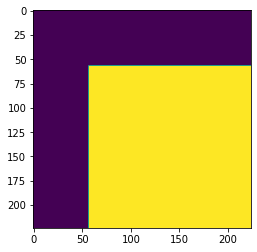

In [13]:
arre = erosion(arr[None,None,:,:], torch.ones(15,15)).squeeze()
plt.imshow(arre)

In [9]:
arre[50:60,50:60]

tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 1., 1., 1.],
        [0., 0., 0., 0., 0., 0., 0., 1., 1., 1.],
        [0., 0., 0., 0., 0., 0., 0., 1., 1., 1.]])

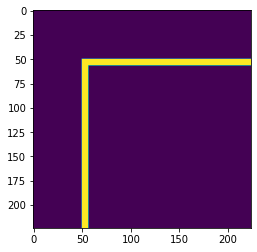

In [8]:
plt.imshow(arr-arre)

In [1]:
from kornia.filters import gaussian_blur2d
import torch
import matplotlib.pyplot as plt

In [62]:
arr = torch.zeros(224,224)
arr[50:100, 50:100] = 5.

In [63]:
arrb = gaussian_blur2d(arr[None,None], (151,151), (50,50))

In [51]:
arre = torch.zeros_like(arr)
arre[60:90,60:90] = 1

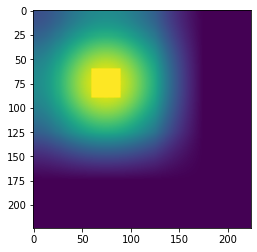

In [64]:
plt.imshow(torch.clamp((torch.clamp(arrb.squeeze(),max=1)+arre),max=1))

In [67]:
arr_add = torch.clamp((arrb.squeeze()+arre),max=1)

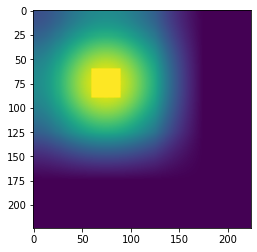

In [68]:
plt.imshow(arr_add)

In [1]:
import torch
import random
import math
import numpy as np
import h5py as h5
import imageio
import matplotlib.pyplot as plt
import pickle
from tqdm.notebook import tqdm
from kornia.filters import gaussian_blur2d
from kornia.morphology import erosion, dilation


gt_labels = imageio.volread('/n/home11/abanerjee/pytorch_connectomics/datasets/SNEMI3D/train-labels.tif')
vol = imageio.volread('/n/home11/abanerjee/pytorch_connectomics/datasets/SNEMI3D/train-input.tif')

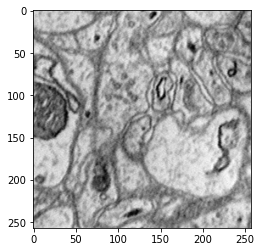

In [3]:
vol_crop = vol[0,:257,:257]
plt.imshow(vol_crop, cmap='gray')

In [4]:
from skimage.feature import canny

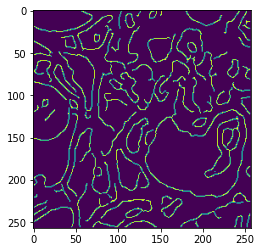

In [8]:
plt.imshow(canny(vol_crop, sigma=3))

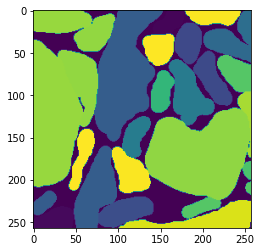

In [2]:
plt.imshow(gt_labels[:33,:257,:257][0])

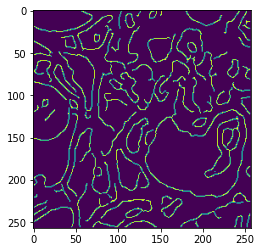

In [7]:
plt.imshow(canny(vol_crop, sigma=3))

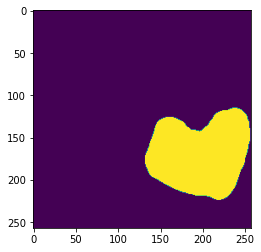

In [3]:
plt.imshow(gt_labels[:33,:257,:257][0]==327)

In [4]:
gt_crop = gt_labels[:33,:257,:257] == 327

> <ipython-input-8-5fc47c6cabe9>(8)compute_edt()
      7     import ipdb; ipdb.set_trace()
----> 8     GT = np.squeeze(GT)
      9     res = np.zeros(GT.shape)

ipdb> n
> <ipython-input-8-5fc47c6cabe9>(9)compute_edt()
      8     GT = np.squeeze(GT)
----> 9     res = np.zeros(GT.shape)
     10     # for i in range(GT.shape[0]):

ipdb> 
> <ipython-input-8-5fc47c6cabe9>(11)compute_edt()
     10     # for i in range(GT.shape[0]):
---> 11     posmask = GT
     12     negmask = ~posmask

ipdb> 
> <ipython-input-8-5fc47c6cabe9>(12)compute_edt()
     11     posmask = GT
---> 12     negmask = ~posmask
     13     pos_edt = distance_transform_edt(posmask)

ipdb> 
> <ipython-input-8-5fc47c6cabe9>(13)compute_edt()
     12     negmask = ~posmask
---> 13     pos_edt = distance_transform_edt(posmask)
     14     pos_edt = (np.max(pos_edt)-pos_edt)*posmask

ipdb> 
> <ipython-input-8-5fc47c6cabe9>(14)compute_edt()
     13     pos_edt = distance_transform_edt(posmask)
---> 14     pos_edt = (np.max(pos_

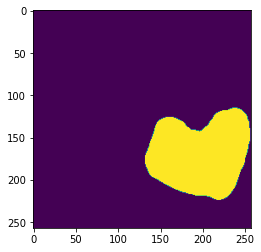

ipdb> plt.imshow(pos_edt[0]); plt.pause(1)


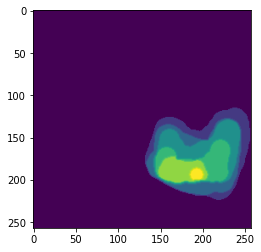

ipdb> c


In [8]:
from scipy.ndimage import distance_transform_edt
def compute_edt(GT):
    """
    GT.shape = (batch_size, x,y,z)
    only for binary segmentation
    """
    import ipdb; ipdb.set_trace()
    GT = np.squeeze(GT)
    res = np.zeros(GT.shape)
    # for i in range(GT.shape[0]):
    posmask = GT
    negmask = ~posmask
    pos_edt = distance_transform_edt(posmask)
    pos_edt = (np.max(pos_edt)-pos_edt)*posmask 
    neg_edt =  distance_transform_edt(negmask)
    neg_edt = (np.max(neg_edt)-neg_edt)*negmask        
    res = pos_edt/np.max(pos_edt) + neg_edt/np.max(neg_edt)
    return res

edt = compute_edt(gt_crop)

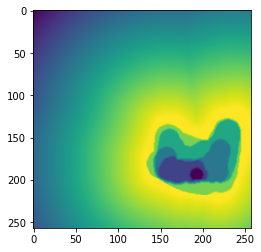

In [7]:
plt.imshow(edt[0])

In [4]:
label = (gt_labels[:33,:257,:257]==327).astype(np.float32)
label_dil = dilation(torch.from_numpy(label)[None], torch.ones(21,21)).squeeze().numpy()

ValueError: Input size must have 4 dimensions. Got 5

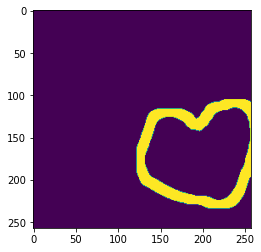

In [8]:
plt.imshow(label_dil[0] - label[0])

In [10]:
label_dil = label_dil.numpy()

In [11]:
wt = np.clip(gaussian_blur2d(5*torch.from_numpy(label_dil)[None], (151,151), (50,50)).squeeze().numpy() + label, a_min=0, a_max=1)

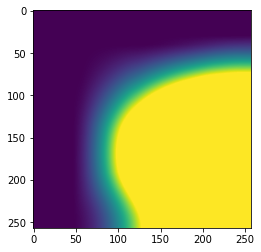

In [19]:
plt.imshow(wt[0])

In [14]:
gb = gaussian_blur2d(5*torch.from_numpy(label_dil)[None], (151,151), (50,50)).squeeze().numpy()

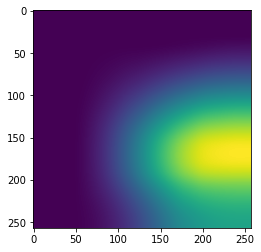

In [15]:
plt.imshow(gb[0])

In [16]:
label = (gt_labels[:33,:257,:257]==327).astype(np.float32)
label_er = erosion(torch.from_numpy(label)[None], torch.ones(21,21)).squeeze().numpy()

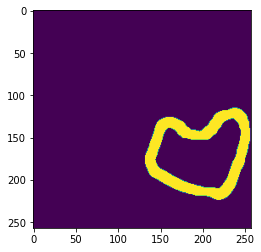

In [17]:
plt.imshow(label[0]-label_er[0])

In [18]:
plt.imshow(label_er[0])

NameError: name 'label_er' is not defined

In [39]:
arrb.max()

tensor(7.7671)

In [40]:
arrb.squeeze()[:150,:150].min()

tensor(0.4838)

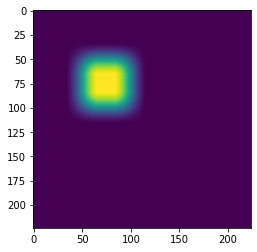

In [58]:
plt.imshow(arrb.squeeze())

In [59]:
arrb = gaussian_blur2d(arr[None,None], (61,61), (20,20)) + gaussian_blur2d(arr[None,None], (31,31), (10,10)) #+ gaussian_blur2d(arr[None,None], (15,15), (5,5))

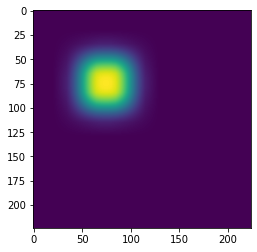

In [60]:
plt.imshow(arrb.squeeze()/arrb.max())

In [70]:
arrb1 = gaussian_blur2d(arr[None,None], (61,61), (20,20))
arrb1 = arrb1/arrb1.max()
arrb2 = gaussian_blur2d(arr[None,None], (31,31), (10,10))
arrb2 = arrb2/arrb2.max()
arrb3 = gaussian_blur2d(arr[None,None], (15,15), (5,5))
# arrb3 = arrb3/arrb3.max()
# arrb = (arrb1+arrb2+arrb3)/3

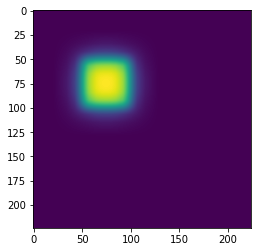

In [69]:
plt.imshow(arrb.squeeze())

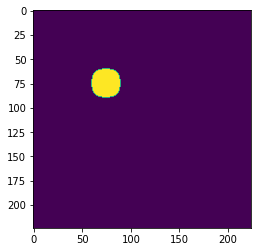

In [72]:
plt.imshow((arrb>0.9).squeeze())

In [51]:
arrb.squeeze()[25:120,25:120]

tensor([[0.0029, 0.0035, 0.0041,  ..., 0.0078, 0.0070, 0.0062],
        [0.0035, 0.0042, 0.0049,  ..., 0.0094, 0.0084, 0.0075],
        [0.0041, 0.0049, 0.0058,  ..., 0.0111, 0.0100, 0.0089],
        ...,
        [0.0078, 0.0094, 0.0111,  ..., 0.0212, 0.0190, 0.0169],
        [0.0070, 0.0084, 0.0100,  ..., 0.0190, 0.0170, 0.0151],
        [0.0062, 0.0075, 0.0089,  ..., 0.0169, 0.0151, 0.0134]])

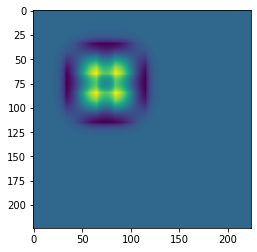

In [37]:
plt.imshow((gaussian_blur2d(arr[None,None], (31,31), (10,10)) - gaussian_blur2d(arr[None,None], (101,101), (10,10))).squeeze())

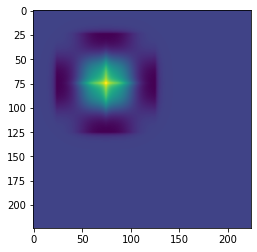

In [38]:
plt.imshow((gaussian_blur2d(arr[None,None], (51,51), (10,10)) - gaussian_blur2d(arr[None,None], (101,101), (10,10))).squeeze())

In [39]:
from kornia.filters import median_blur

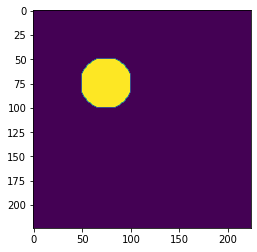

In [41]:
arrb = median_blur(arr[None,None], (31,31))
plt.imshow(arrb.squeeze())

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import skimage.filters as filters

In [4]:
arr = np.zeros((5, 33, 224, 224))
arr[0,:, 50:100,50:100] = 1

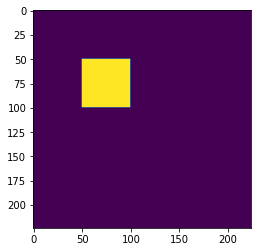

In [5]:
plt.imshow(arr[0, 0])

In [15]:
op = filters.gaussian(5*arr, sigma=50, multichannel=True)

In [12]:
op.shape

(5, 33, 224, 224)

In [3]:
import torch
import torch.fft
x = torch.randn(25, 129, 129)
fft_out = torch.fft.rfftn(x, dim=-1)

In [4]:
fft_out.shape

torch.Size([25, 129, 65])

In [7]:
fft_out

tensor([[[ 1.0445e+01+0.0000e+00j,  8.6649e+00+4.4812e+00j,
          -5.7695e+00+3.0368e+00j,  ...,
          -9.3137e+00+4.2587e+00j,  7.1910e+00+9.6303e+00j,
           2.7602e+00-5.0054e+00j],
         [ 1.0586e+01+0.0000e+00j, -6.2507e+00-7.0154e+00j,
          -5.2184e+00+7.8027e+00j,  ...,
          -2.2552e+00-1.4113e+00j,  4.9618e+00-1.4010e+01j,
          -1.0359e+00+2.3232e+00j],
         [-1.1631e+01+0.0000e+00j, -9.1628e+00+8.7369e+00j,
           3.6884e+00+2.9380e+00j,  ...,
           1.1243e+00-5.0533e+00j,  2.3578e+00-3.8456e+00j,
          -1.7186e+01+7.7426e+00j],
         ...,
         [-1.2262e+01+0.0000e+00j,  1.1666e+00+6.6594e+00j,
          -1.8530e+00+9.3863e-01j,  ...,
          -1.4350e+01+2.0557e+01j, -1.1861e+01+1.7943e+00j,
          -1.0871e+00-8.3721e+00j],
         [-8.9997e+00+0.0000e+00j,  1.3921e+01+1.3719e+01j,
          -7.2005e-01-3.2461e+00j,  ...,
          -1.7322e+00+1.1906e+01j, -1.1982e+01+4.0289e+00j,
          -5.4416e+00+1.2359e+01j],
 

In [2]:
torch.__version__

'1.7.1'

In [6]:
fft_out.real

tensor([[[ 1.0445e+01,  8.6649e+00, -5.7695e+00,  ..., -9.3137e+00,
           7.1910e+00,  2.7602e+00],
         [ 1.0586e+01, -6.2507e+00, -5.2184e+00,  ..., -2.2552e+00,
           4.9618e+00, -1.0359e+00],
         [-1.1631e+01, -9.1628e+00,  3.6884e+00,  ...,  1.1243e+00,
           2.3578e+00, -1.7186e+01],
         ...,
         [-1.2262e+01,  1.1666e+00, -1.8530e+00,  ..., -1.4350e+01,
          -1.1861e+01, -1.0871e+00],
         [-8.9997e+00,  1.3921e+01, -7.2005e-01,  ..., -1.7322e+00,
          -1.1982e+01, -5.4416e+00],
         [ 6.8336e+00,  7.5398e+00, -3.2599e-01,  ...,  1.7398e+00,
          -7.5989e+00,  1.4617e+01]],

        [[ 1.2696e+01,  4.6379e+00,  1.1040e+01,  ...,  4.0111e+00,
          -5.3164e-01, -9.8469e+00],
         [-1.4552e+00,  2.8910e+00, -6.4110e+00,  ...,  2.3937e+00,
           2.2142e+00, -7.2328e+00],
         [ 1.1131e+01, -6.4015e+00,  5.1334e+00,  ...,  9.1395e+00,
          -3.2516e+00, -1.1962e+01],
         ...,
         [ 7.5963e-03, -7

In [11]:
fft_out_full = torch.fft.fftn(x)
fft_out_full.shape

torch.Size([25, 129, 129])

In [12]:
torch.fft.rfftn(x).shape

torch.Size([25, 129, 65])

In [14]:
(torch.fft.rfftn(x) == fft_out)

tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]],

        [[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]],

        [[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [

In [17]:
torch.fft.fft(torch.fft.fft(torch.fft.fft(x, dim=-1), dim=-2), dim=-3).real == fft_out_full.real

tensor([[[ True, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False,  True],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]],

        [[False, False, False,  ..., False, False,  True],
         [ True, False, False,  ..., False, False, False],
         [False,  True,  True,  ..., False, False, False],
         ...,
         [False, False, False,  ...,  True, False, False],
         [ True, False, False,  ...,  True, False, False],
         [False, False, False,  ..., False,  True, False]],

        [[False, False, False,  ..., False, False, False],
         [ True, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [

In [1]:
from fast_ffn.model.blocks import *

In [16]:
torch.fft.rfftn(x).shape

torch.Size([25, 129, 65])

In [2]:
fb = FNetBlock(3, [17, 33, 33])

In [3]:
import torch

op = fb(torch.randn(1, 3, 17, 33, 33))

In [4]:
op.shape

torch.Size([1, 3, 17, 33, 33])

In [5]:
fb

FNetBlock(
  (norm): LayerNorm((33,), eps=1e-05, elementwise_affine=True)
  (convs): Sequential(
    (0): Conv3d(4, 4, kernel_size=(1, 1, 1), stride=(1, 1, 1))
    (1): GELU()
    (2): Conv3d(4, 4, kernel_size=(1, 1, 1), stride=(1, 1, 1))
  )
  (out_conv): Conv3d(4, 3, kernel_size=(1, 1, 1), stride=(1, 1, 1))
)

In [4]:
%debug

> /n/home11/abanerjee/fast_ffn/fast_ffn/model/blocks.py(46)forward()
     44         pos_emb = self.pos_embs[0].view(1, -1, 1, 1) + self.pos_embs[0].view(1, 1, -1, 1) + self.pos_embs[0].view(1, 1, 1, -1)
     45         pos_emb = pos_emb.expand(shape[0], -1, -1, -1, -1)
---> 46         x_emb = torch.cat([x, pos_emb], dim=1)
     47 
     48 

ipdb> pos_emb.shape
torch.Size([1, 1, 17, 17, 17])
ipdb> exit


In [4]:
%debug

> /n/home11/abanerjee/fast_ffn/fast_ffn/model/blocks.py(43)forward()
     41     def forward(self, x):
     42         shape = x.shape
---> 43         shape[1] += 1
     44 
     45         pos_emb = self.pos_embs[0].view(1, -1, 1, 1) + self.pos_embs[1].view(1, 1, -1, 1) + self.pos_embs[2].view(1, 1, 1, -1)

ipdb> shape.tolist()
*** AttributeError: 'torch.Size' object has no attribute 'tolist'
ipdb> list(shape)
*** Error in argument: '(shape)'
ipdb> shape
torch.Size([1, 3, 17, 33, 33])
ipdb> list(shape)
*** Error in argument: '(shape)'
ipdb> list(x.shape)
*** Error in argument: '(x.shape)'
ipdb> list(x.size())
*** Error in argument: '(x.size())'
ipdb> [int(n) for n in x.shape]
[1, 3, 17, 33, 33]
ipdb> exit


In [7]:
for module in fb.named_modules():
    print(module)

('', FNetBlock(
  (norm): LayerNorm((33,), eps=1e-05, elementwise_affine=True)
  (convs): Sequential(
    (0): Conv3d(4, 4, kernel_size=(1, 1, 1), stride=(1, 1, 1))
    (1): GELU()
    (2): Conv3d(4, 4, kernel_size=(1, 1, 1), stride=(1, 1, 1))
  )
  (out_conv): Conv3d(4, 3, kernel_size=(1, 1, 1), stride=(1, 1, 1))
))
('norm', LayerNorm((33,), eps=1e-05, elementwise_affine=True))
('convs', Sequential(
  (0): Conv3d(4, 4, kernel_size=(1, 1, 1), stride=(1, 1, 1))
  (1): GELU()
  (2): Conv3d(4, 4, kernel_size=(1, 1, 1), stride=(1, 1, 1))
))
('convs.0', Conv3d(4, 4, kernel_size=(1, 1, 1), stride=(1, 1, 1)))
('convs.1', GELU())
('convs.2', Conv3d(4, 4, kernel_size=(1, 1, 1), stride=(1, 1, 1)))
('out_conv', Conv3d(4, 3, kernel_size=(1, 1, 1), stride=(1, 1, 1)))


In [6]:
for param in fb.parameters():
    print(param.shape)

torch.Size([17])
torch.Size([33])
torch.Size([33])
torch.Size([33])
torch.Size([33])
torch.Size([4, 4, 1, 1, 1])
torch.Size([4])
torch.Size([4, 4, 1, 1, 1])
torch.Size([4])
torch.Size([3, 4, 1, 1, 1])
torch.Size([3])


In [4]:
import math
import torch
import torch.nn as nn
import torch.nn.functional as F

class AxialAttention(nn.Module):
    def __init__(self, in_planes, out_planes, groups=8, kernel_size=56,
                 stride=1, bias=False, width=False):
        assert (in_planes % groups == 0) and (out_planes % groups == 0)
        super(AxialAttention, self).__init__()
        self.in_planes = in_planes
        self.out_planes = out_planes
        self.groups = groups
        self.group_planes = out_planes // groups
        self.kernel_size = kernel_size
        self.stride = stride
        self.bias = bias
        self.width = width

        # Multi-head self attention
        self.qkv_transform = nn.Conv1d(in_planes, out_planes * 2, kernel_size=1, stride=1,
                                           padding=0, bias=False)
        self.bn_qkv = nn.BatchNorm1d(out_planes * 2)
        self.bn_similarity = nn.BatchNorm2d(groups * 3)
        #self.bn_qk = nn.BatchNorm2d(groups)
        #self.bn_qr = nn.BatchNorm2d(groups)
        #self.bn_kr = nn.BatchNorm2d(groups)
        self.bn_output = nn.BatchNorm1d(out_planes * 2)

        # Position embedding
        self.relative = nn.Parameter(torch.randn(self.group_planes * 2, kernel_size * 2 - 1), requires_grad=True)
        query_index = torch.arange(kernel_size).unsqueeze(0)
        key_index = torch.arange(kernel_size).unsqueeze(1)
        relative_index = key_index - query_index + kernel_size - 1
        self.register_buffer('flatten_index', relative_index.view(-1))
        if stride > 1:
            self.pooling = nn.AvgPool2d(stride, stride=stride)

        self.reset_parameters()

    def forward(self, x):
        if self.width:
            x = x.permute(0, 2, 1, 3)
        else:
            x = x.permute(0, 3, 1, 2)  # N, W, C, H
        N, W, C, H = x.shape
        x = x.contiguous().view(N * W, C, H)

        # Transformations
        qkv = self.bn_qkv(self.qkv_transform(x))
        q, k, v = torch.split(qkv.reshape(N * W, self.groups, self.group_planes * 2, H), [self.group_planes // 2, self.group_planes // 2, self.group_planes], dim=2)

        # Calculate position embedding
        all_embeddings = torch.index_select(self.relative, 1, self.flatten_index).view(self.group_planes * 2, self.kernel_size, self.kernel_size)
        q_embedding, k_embedding, v_embedding = torch.split(all_embeddings, [self.group_planes // 2, self.group_planes // 2, self.group_planes], dim=0)
        qr = torch.einsum('bgci,cij->bgij', q, q_embedding)
        kr = torch.einsum('bgci,cij->bgij', k, k_embedding).transpose(2, 3)
        qk = torch.einsum('bgci, bgcj->bgij', q, k)
        stacked_similarity = torch.cat([qk, qr, kr], dim=1)
        stacked_similarity = self.bn_similarity(stacked_similarity).view(N * W, 3, self.groups, H, H).sum(dim=1)
        #stacked_similarity = self.bn_qr(qr) + self.bn_kr(kr) + self.bn_qk(qk)
        # (N, groups, H, H, W)
        similarity = F.softmax(stacked_similarity, dim=3)
        sv = torch.einsum('bgij,bgcj->bgci', similarity, v)
        sve = torch.einsum('bgij,cij->bgci', similarity, v_embedding)
        stacked_output = torch.cat([sv, sve], dim=-1).view(N * W, self.out_planes * 2, H)
        output = self.bn_output(stacked_output).view(N, W, self.out_planes, 2, H).sum(dim=-2)

        if self.width:
            output = output.permute(0, 2, 1, 3)
        else:
            output = output.permute(0, 2, 3, 1)

        if self.stride > 1:
            output = self.pooling(output)

        return output

    def reset_parameters(self):
        self.qkv_transform.weight.data.normal_(0, math.sqrt(1. / self.in_planes))
        #nn.init.uniform_(self.relative, -0.1, 0.1)
        nn.init.normal_(self.relative, 0., math.sqrt(1. / self.group_planes))

In [5]:
aa = AxialAttention(6, 6, groups=2)

In [6]:
aa.flatten_index

tensor([55, 54, 53,  ..., 57, 56, 55])

In [7]:
aa.flatten_index.shape

torch.Size([3136])

In [8]:
kernel_size=56
query_index = torch.arange(kernel_size).unsqueeze(0)
key_index = torch.arange(kernel_size).unsqueeze(1)
relative_index = key_index - query_index + kernel_size - 1

In [10]:
query_index.shape, key_index.shape, relative_index.shape

(torch.Size([1, 56]), torch.Size([56, 1]), torch.Size([56, 56]))

In [11]:
relative_index

tensor([[ 55,  54,  53,  ...,   2,   1,   0],
        [ 56,  55,  54,  ...,   3,   2,   1],
        [ 57,  56,  55,  ...,   4,   3,   2],
        ...,
        [108, 107, 106,  ...,  55,  54,  53],
        [109, 108, 107,  ...,  56,  55,  54],
        [110, 109, 108,  ...,  57,  56,  55]])

In [12]:
aa.relative.shape

torch.Size([6, 111])

In [ ]:
class StripedAxialAttention(nn.Module):
    def __init__(self):
        pass
    
    def forward(self, x):
        n,c,d,h,w = x.shape
        x.view(n,c,d*h,w).transpose(2,1)
        
        q, k, v = self.qkv(x).chunk(3, 1) # n,h*d,s,w
        
        qr = torch.einsum('bgci,cij->bgij', q, q_embedding)
        kr = torch.einsum('bgci,cij->bgij', k, k_embedding).transpose(2, 3)
        qk = torch.einsum('bgci, bgcj->bgij', q, k)
        
        

## Copied Model

In [1]:
## Copied Model
from __future__ import print_function, division
from typing import Optional, Union, List

import math
import torch
import torch.nn as nn
from connectomics.model.block.basic import get_conv, conv3d_norm_act
from connectomics.model.block.residual import InvertedResidual, InvertedResidualDilated
from connectomics.model.block.non_local import NonLocalBlock3D
from connectomics.model.utils import get_activation, get_norm_3d

class BasicBlock3d(nn.Module):
    def __init__(self,
                 in_planes: int,
                 planes: int,
                 stride: Union[int, tuple] = 1,
                 dilation: int = 1,
                 groups: int = 1,
                 pad_mode: str = 'replicate',
                 act_mode: str = 'elu',
                 norm_mode: str = 'bn',
                 isotropic: bool = True,
                 **_):
        super(BasicBlock3d, self).__init__()
        if isotropic:
            kernel_size, padding = 3, dilation
        else:
            kernel_size, padding = (1, 3, 3), (0, dilation, dilation)
        self.conv = nn.Sequential(
            conv3d_norm_act(in_planes, planes, kernel_size=kernel_size, dilation=dilation,
                            stride=stride, groups=groups, padding=padding, bias=True,
                            pad_mode=pad_mode, norm_mode=norm_mode, act_mode=act_mode),
            conv3d_norm_act(planes, planes, kernel_size=kernel_size, dilation=dilation,
                            stride=1, groups=groups, padding=padding, bias=True,
                            pad_mode=pad_mode, norm_mode=norm_mode, act_mode='none')
        )
        if stride != 1:
            if stride == (1,2,2):
                pad = (1,1,1,1,0,0) #x,y,z format
            else:
                pad = 1
            
            self.projector = nn.Sequential(
                nn.ReplicationPad3d(pad),
                nn.AvgPool3d(stride, stride),
                conv3d_norm_act(
                in_planes, planes, kernel_size=1, padding=0,
                stride=1, norm_mode=norm_mode, act_mode='none')
            )
        elif in_planes != planes: 
             self.projector = conv3d_norm_act(
                in_planes, planes, kernel_size=1, padding=0,
                stride=1, norm_mode=norm_mode, act_mode='none')
        else:
            self.projector = nn.Identity()
        self.act = get_activation(act_mode)

    def forward(self, x):
        y = self.conv(x)
        y = y + self.projector(x)
        return self.act(y)

class DilatedBlock(nn.Module):
    def __init__(self, conv_type, in_channel, inplanes, dilation_factors, pad_mode):
        super().__init__()
        self.conv = nn.ModuleList([get_conv(conv_type)(in_channel, inplanes, kernel_size=3, 
                bias=False, stride=1, dilation=dilation_factors[i], padding=dilation_factors[i], 
                padding_mode=pad_mode) for i in range(4)])

    def forward(self, x):
        return self._conv_and_cat(x, self.conv)
    
    def _conv_and_cat(self, x, conv_layers):
        y = [conv(x) for conv in conv_layers]
        return torch.cat(y, dim=1)

class FFNEncoder(nn.Module):
    def __init__(self,
                 block_type: str = 'inverted_res',
                 in_channel: int = 2,
                 filters: List[int] = [32, 64, 64, 96, 128],
                 blocks: List[int] = [1, 2, 2, 3, 4],
                 ks: List[int] = [3, 3, 5, 3, 3],
                 isotropy: List[bool] = [False, False, False, True, True],
                 attention: str = 'squeeze_excitation',
                 bn_momentum: float = 0.01,
                 conv_type: str = 'standard',
                 pad_mode: str = 'replicate',
                 act_mode: str = 'elu',
                 norm_mode: str = 'bn',
                 fmap_size: List[int] = [17, 129, 129],
                 **_):
        super().__init__()
        self.inplanes = filters[0]

        self.all_dilated = True
        num_conv = 4
        self.conv1 = DilatedBlock(conv_type, 
                        in_channel, 
                        self.inplanes//num_conv, 
                        [1, 2, 4, 8], 
                        pad_mode)

        self.bn1 = get_norm_3d(norm_mode, self.inplanes, bn_momentum)
        self.relu = get_activation(act_mode)

        shared_kwargs = {
            'bn_momentum': bn_momentum,
            'norm_mode': norm_mode,
            'attention': attention,
            'pad_mode': pad_mode,
            'act_mode': act_mode,
        }

        self.layer0 = ffn_stack(filters[0], filters[0], stride=2,
                               repeats=blocks[0], shared=shared_kwargs, fmap_size=fmap_size)
        
        fmap_size = [math.ceil(fmap_size[0]/2), math.ceil(fmap_size[1]/2), math.ceil(fmap_size[2]/2)]
        self.layer1 = ffn_stack(filters[0], filters[1], stride=2,
                               repeats=blocks[1], shared=shared_kwargs, fmap_size=fmap_size)
        
        fmap_size = [math.ceil(fmap_size[0]/2), math.ceil(fmap_size[1]/2), math.ceil(fmap_size[2]/2)]
        self.layer2 = ffn_stack(filters[1], filters[2], stride=(1, 2, 2),
                               repeats=blocks[2], shared=shared_kwargs, fmap_size=fmap_size)

        fmap_size = [fmap_size[0], math.ceil(fmap_size[1]/2), math.ceil(fmap_size[2]/2)]
        self.layer3 = ffn_stack(filters[2], filters[3], stride=(1, 2, 2),
                               repeats=blocks[3],  shared=shared_kwargs, fmap_size=fmap_size)
        
        fmap_size = [fmap_size[0], math.ceil(fmap_size[1]/2), math.ceil(fmap_size[2]/2)]
        self.layer4 = ffn_stack(filters[3], filters[4], stride=2,
                               repeats=blocks[4], shared=shared_kwargs, fmap_size=fmap_size)

    def forward(self, x):
        # See note [TorchScript super()]
        import ipdb; ipdb.set_trace()
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)

        x = self.layer0(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        return x
    
def ffn_stack(in_ch, out_ch, stride, repeats, shared, fmap_size):
    first = BasicBlock3d(in_ch, out_ch, stride, **shared)
    
    remaining = []
    for _ in range(1, repeats):
        remaining.append(BasicBlock3d(out_ch, out_ch, 1, **shared))
    return nn.Sequential(first, *remaining)

In [2]:
model = FFNEncoder()

In [3]:
import pickle
copied_state_dict = pickle.load(open('/n/home11/abanerjee/ffn_fib25_state_dict.pkl', 'rb'))

In [4]:
copied_state_dict.keys()

odict_keys(['filter_coordinates_close_to_boundary/fraction', 'filter_out_bounds_coordinates/fraction', 'filter_out_bounds_coordinates_1/fraction', 'global_step', 'seed_update/conv0_a/biases', 'seed_update/conv0_a/weights', 'seed_update/conv0_b/biases', 'seed_update/conv0_b/weights', 'seed_update/conv10_a/biases', 'seed_update/conv10_a/weights', 'seed_update/conv10_b/biases', 'seed_update/conv10_b/weights', 'seed_update/conv11_a/biases', 'seed_update/conv11_a/weights', 'seed_update/conv11_b/biases', 'seed_update/conv11_b/weights', 'seed_update/conv1_a/biases', 'seed_update/conv1_a/weights', 'seed_update/conv1_b/biases', 'seed_update/conv1_b/weights', 'seed_update/conv2_a/biases', 'seed_update/conv2_a/weights', 'seed_update/conv2_b/biases', 'seed_update/conv2_b/weights', 'seed_update/conv3_a/biases', 'seed_update/conv3_a/weights', 'seed_update/conv3_b/biases', 'seed_update/conv3_b/weights', 'seed_update/conv4_a/biases', 'seed_update/conv4_a/weights', 'seed_update/conv4_b/biases', 'seed_u

In [5]:
model_state_dict = model.state_dict()
for key in model_state_dict.keys():
#     if 'weight' in key or 'bias' in key:
    print(key)

conv1.conv.0.weight
conv1.conv.1.weight
conv1.conv.2.weight
conv1.conv.3.weight
bn1.weight
bn1.bias
bn1.running_mean
bn1.running_var
bn1.num_batches_tracked
layer0.0.conv.0.0.weight
layer0.0.conv.0.0.bias
layer0.0.conv.0.1.weight
layer0.0.conv.0.1.bias
layer0.0.conv.0.1.running_mean
layer0.0.conv.0.1.running_var
layer0.0.conv.0.1.num_batches_tracked
layer0.0.conv.1.0.weight
layer0.0.conv.1.0.bias
layer0.0.conv.1.1.weight
layer0.0.conv.1.1.bias
layer0.0.conv.1.1.running_mean
layer0.0.conv.1.1.running_var
layer0.0.conv.1.1.num_batches_tracked
layer0.0.projector.2.0.weight
layer0.0.projector.2.1.weight
layer0.0.projector.2.1.bias
layer0.0.projector.2.1.running_mean
layer0.0.projector.2.1.running_var
layer0.0.projector.2.1.num_batches_tracked
layer1.0.conv.0.0.weight
layer1.0.conv.0.0.bias
layer1.0.conv.0.1.weight
layer1.0.conv.0.1.bias
layer1.0.conv.0.1.running_mean
layer1.0.conv.0.1.running_var
layer1.0.conv.0.1.num_batches_tracked
layer1.0.conv.1.0.weight
layer1.0.conv.1.0.bias
layer1.0

In [6]:
model_state_dict['layer1.0.conv.0.0.weight'].shape

torch.Size([64, 32, 3, 3, 3])

In [7]:
msd = model_state_dict
csd = copied_state_dict

### Input

In [8]:
msd['conv1.conv.0.weight'].shape, csd['seed_update/conv0_a/weights'].shape

(torch.Size([8, 2, 3, 3, 3]), (3, 3, 3, 2, 32))

In [9]:
conv1 = torch.tensor(csd['seed_update/conv0_a/weights']).permute(4,3,0,1,2)
msd['conv1.conv.0.weight'] = conv1[:8]
msd['conv1.conv.1.weight'] = conv1[8:16]
msd['conv1.conv.2.weight'] = conv1[16:24]
msd['conv1.conv.3.weight'] = conv1[24:32]

### Layer0

In [10]:
msd['layer0.0.conv.0.0.weight'].shape, msd['layer0.0.conv.0.0.bias'].shape, msd['layer0.0.conv.1.0.weight'].shape, msd['layer0.0.conv.1.0.bias'].shape

(torch.Size([32, 32, 3, 3, 3]),
 torch.Size([32]),
 torch.Size([32, 32, 3, 3, 3]),
 torch.Size([32]))

In [11]:
layer0 = torch.tensor(csd['seed_update/conv0_b/weights']).permute(4,3,0,1,2)
msd['layer0.0.conv.0.0.weight'] = layer0
msd['layer0.0.conv.0.0.bias'] = torch.tensor(csd['seed_update/conv0_b/biases'])
msd['layer0.0.conv.1.0.weight'] = layer0
msd['layer0.0.conv.1.0.bias'] = torch.tensor(csd['seed_update/conv0_b/biases'])

### Layer1

In [12]:
for i in range(2):
    weight1 = torch.tensor(csd[f'seed_update/conv{2+i}_a/weights']).permute(4,3,0,1,2)
    bias1 = torch.tensor(csd[f'seed_update/conv{2+i}_a/biases'])
    mul1, mul2 = msd[f'layer1.{i}.conv.0.0.weight'].shape[0]//32, msd[f'layer1.{i}.conv.0.0.weight'].shape[1]//32
    weight1 = weight1.unsqueeze(0).unsqueeze(2).expand(mul1, 32, mul2, 32, -1, -1, -1).flatten(0,1).flatten(1,2)
    bias1 = bias1.unsqueeze(0).expand(mul1, -1).flatten()
    
    msd[f'layer1.{i}.conv.0.0.weight'] = weight1
    msd[f'layer1.{i}.conv.0.0.bias'] = bias1
    
    weight2 = torch.tensor(csd[f'seed_update/conv{2+i}_b/weights']).permute(4,3,0,1,2)
    bias2 = torch.tensor(csd[f'seed_update/conv{2+i}_b/biases'])
    weight2 = weight2.unsqueeze(0).unsqueeze(2).expand(mul1, 32, mul1, 32, -1, -1, -1).flatten(0,1).flatten(1,2)
    bias2 = bias2.unsqueeze(0).expand(mul1, -1).flatten()
    
    msd[f'layer1.{i}.conv.1.0.weight'] = weight2
    msd[f'layer1.{i}.conv.1.0.bias'] = bias2

### Layer2

In [13]:
for i in range(2):
    weight1 = torch.tensor(csd[f'seed_update/conv{3+i}_a/weights']).permute(4,3,0,1,2)
    bias1 = torch.tensor(csd[f'seed_update/conv{3+i}_a/biases'])
    mul1, mul2 = msd[f'layer2.{i}.conv.0.0.weight'].shape[0]//32, msd[f'layer2.{i}.conv.0.0.weight'].shape[1]//32
    weight1 = weight1.unsqueeze(0).unsqueeze(2).expand(mul1, 32, mul2, 32, -1, -1, -1).flatten(0,1).flatten(1,2)
    bias1 = bias1.unsqueeze(0).expand(mul1, -1).flatten()
    
    msd[f'layer2.{i}.conv.0.0.weight'] = weight1
    msd[f'layer2.{i}.conv.0.0.bias'] = bias1
    
    weight2 = torch.tensor(csd[f'seed_update/conv{3+i}_b/weights']).permute(4,3,0,1,2)
    bias2 = torch.tensor(csd[f'seed_update/conv{3+i}_b/biases'])
    weight2 = weight2.unsqueeze(0).unsqueeze(2).expand(mul1, 32, mul1, 32, -1, -1, -1).flatten(0,1).flatten(1,2)
    bias2 = bias2.unsqueeze(0).expand(mul1, -1).flatten()
    
    msd[f'layer2.{i}.conv.1.0.weight'] = weight2
    msd[f'layer2.{i}.conv.1.0.bias'] = bias2

### Layer3

In [14]:
for i in range(3):
    weight1 = torch.tensor(csd[f'seed_update/conv{5+i}_a/weights']).permute(4,3,0,1,2)
    bias1 = torch.tensor(csd[f'seed_update/conv{5+i}_a/biases'])
    mul1, mul2 = msd[f'layer3.{i}.conv.0.0.weight'].shape[0]//32, msd[f'layer3.{i}.conv.0.0.weight'].shape[1]//32
    weight1 = weight1.unsqueeze(0).unsqueeze(2).expand(mul1, 32, mul2, 32, -1, -1, -1).flatten(0,1).flatten(1,2)
    bias1 = bias1.unsqueeze(0).expand(mul1, -1).flatten()
    
    assert msd[f'layer3.{i}.conv.0.0.weight'].shape == weight1.shape
    assert msd[f'layer3.{i}.conv.0.0.bias'].shape == bias1.shape
    msd[f'layer3.{i}.conv.0.0.weight'] = weight1
    msd[f'layer3.{i}.conv.0.0.bias'] = bias1
    
    weight2 = torch.tensor(csd[f'seed_update/conv{5+i}_b/weights']).permute(4,3,0,1,2)
    bias2 = torch.tensor(csd[f'seed_update/conv{5+i}_b/biases'])
    weight2 = weight2.unsqueeze(0).unsqueeze(2).expand(mul1, 32, mul1, 32, -1, -1, -1).flatten(0,1).flatten(1,2)
    bias2 = bias2.unsqueeze(0).expand(mul1, -1).flatten()
    
    assert msd[f'layer3.{i}.conv.1.0.weight'].shape == weight2.shape
    assert msd[f'layer3.{i}.conv.1.0.bias'].shape == bias2.shape
    msd[f'layer3.{i}.conv.1.0.weight'] = weight2
    msd[f'layer3.{i}.conv.1.0.bias'] = bias2

### Layer4

In [15]:
for i in range(4):
    weight1 = torch.tensor(csd[f'seed_update/conv{8+i}_a/weights']).permute(4,3,0,1,2)
    bias1 = torch.tensor(csd[f'seed_update/conv{8+i}_a/biases'])
    mul1, mul2 = msd[f'layer4.{i}.conv.0.0.weight'].shape[0]//32, msd[f'layer4.{i}.conv.0.0.weight'].shape[1]//32
    weight1 = weight1.unsqueeze(0).unsqueeze(2).expand(mul1, 32, mul2, 32, -1, -1, -1).flatten(0,1).flatten(1,2)
    bias1 = bias1.unsqueeze(0).expand(mul1, -1).flatten()
    
    assert msd[f'layer4.{i}.conv.0.0.weight'].shape == weight1.shape
    assert msd[f'layer4.{i}.conv.0.0.bias'].shape == bias1.shape
    msd[f'layer4.{i}.conv.0.0.weight'] = weight1
    msd[f'layer4.{i}.conv.0.0.bias'] = bias1
    
    weight2 = torch.tensor(csd[f'seed_update/conv{8+i}_b/weights']).permute(4,3,0,1,2)
    bias2 = torch.tensor(csd[f'seed_update/conv{8+i}_b/biases'])
    weight2 = weight2.unsqueeze(0).unsqueeze(2).expand(mul1, 32, mul1, 32, -1, -1, -1).flatten(0,1).flatten(1,2)
    bias2 = bias2.unsqueeze(0).expand(mul1, -1).flatten()
    
    assert msd[f'layer4.{i}.conv.1.0.weight'].shape == weight2.shape
    assert msd[f'layer4.{i}.conv.1.0.bias'].shape == bias2.shape
    msd[f'layer4.{i}.conv.1.0.weight'] = weight2
    msd[f'layer4.{i}.conv.1.0.bias'] = bias2

In [16]:
model.load_state_dict(msd)

<All keys matched successfully>

In [17]:
torch.save(model.state_dict(), 'ffn_encoder_copied.pkl')

In [18]:
model(torch.randn(1,2, 25, 129, 129)).shape

> <ipython-input-1-a254f05c8717>(138)forward()
    137         import ipdb; ipdb.set_trace()
--> 138         x = self.conv1(x)
    139         x = self.bn1(x)

ipdb> c


torch.Size([1, 128, 4, 5, 5])

In [21]:
csd['seed_update/conv_lom/weights'].shape

(1, 1, 1, 32, 1)

In [22]:
from einops import rearrange

In [26]:
q = torch.randn(1, 4, 5, 5, 5)
q = rearrange(q, 'n (h d) z y x -> n h (z y x) d', h=2)

In [27]:
q.shape

torch.Size([1, 2, 125, 2])

In [30]:
d, h, w = 2, 8, 10
abs_logit_w = torch.randn(1, 5, 10, 10)
abs_logit_w = rearrange(abs_logit_w, '1 d w w1 -> 1 d 1 1 1 1 w w1').expand(-1, -1, d, d, h, h, w, w)

In [31]:
abs_logit_w.shape

torch.Size([1, 5, 2, 2, 8, 8, 10, 10])

In [1]:
from fast_ffn.model.blocks import *

In [2]:
sa = SelfAttention(6, [10, 10, 10])
sa(torch.randn(1,6,10,10,10)).shape

torch.Size([1, 6, 10, 10, 10])

In [3]:
sra = StripedAttention(6, [10, 10, 10])
sra(torch.randn(1,6,10,10,10)).shape

torch.Size([1, 6, 10, 10, 10])

In [1]:
from fast_ffn.model.model import FFN_FPN2

In [2]:
fpn = FFN_FPN2(in_channel=2, out_channel=1, blocks = [1, 2, 2, 3, 4], 
         filters = [32, 64, 64, 96, 128], fmap_size = [17, 129, 129], )

> /n/home11/abanerjee/fast_ffn/fast_ffn/model/backbone.py(375)ffn_stack()
    374     import ipdb; ipdb.set_trace()
--> 375     first = BasicBlock3d(in_ch, out_ch, stride, **shared)
    376 

ipdb> stride
(1, 1, 1)
ipdb> s
--Call--
> /n/home11/abanerjee/fast_ffn/fast_ffn/model/backbone.py(247)__init__()
    246 class BasicBlock3d(nn.Module):
--> 247     def __init__(self,
    248                  in_planes: int,

ipdb> n
> /n/home11/abanerjee/fast_ffn/fast_ffn/model/backbone.py(258)__init__()
    257                  **_):
--> 258         super(BasicBlock3d, self).__init__()
    259         if isotropic:

ipdb> 
> /n/home11/abanerjee/fast_ffn/fast_ffn/model/backbone.py(259)__init__()
    258         super(BasicBlock3d, self).__init__()
--> 259         if isotropic:
    260             kernel_size, padding = 3, dilation

ipdb> 
> /n/home11/abanerjee/fast_ffn/fast_ffn/model/backbone.py(260)__init__()
    259         if isotropic:
--> 260             kernel_size, padding = 3, dilation
   

ipdb> 
> /n/home11/abanerjee/fast_ffn/fast_ffn/model/backbone.py(271)__init__()
    270         )
--> 271         if stride != (1,1,1):
    272             if stride == (1,2,2):

ipdb> 
> /n/home11/abanerjee/fast_ffn/fast_ffn/model/backbone.py(284)__init__()
    283             )
--> 284         elif in_planes != planes:
    285              self.projector = conv3d_norm_act(

ipdb> 
> /n/home11/abanerjee/fast_ffn/fast_ffn/model/backbone.py(289)__init__()
    288         else:
--> 289             self.projector = nn.Identity()
    290         self.act = get_activation(act_mode)

ipdb> 
> /n/home11/abanerjee/fast_ffn/fast_ffn/model/backbone.py(290)__init__()
    289             self.projector = nn.Identity()
--> 290         self.act = get_activation(act_mode)
    291 

ipdb> 
--Return--
None
> /n/home11/abanerjee/fast_ffn/fast_ffn/model/backbone.py(290)__init__()
    289             self.projector = nn.Identity()
--> 290         self.act = get_activation(act_mode)
    291 

ipdb> 
> /n/h

ipdb> 
> /n/home11/abanerjee/fast_ffn/fast_ffn/model/backbone.py(267)__init__()
    266                             pad_mode=pad_mode, norm_mode=norm_mode, act_mode=act_mode),
--> 267             conv3d_norm_act(planes, planes, kernel_size=kernel_size, dilation=dilation,
    268                             stride=1, groups=groups, padding=padding, bias=True,

ipdb> 
> /n/home11/abanerjee/fast_ffn/fast_ffn/model/backbone.py(268)__init__()
    267             conv3d_norm_act(planes, planes, kernel_size=kernel_size, dilation=dilation,
--> 268                             stride=1, groups=groups, padding=padding, bias=True,
    269                             pad_mode=pad_mode, norm_mode=norm_mode, act_mode='none')

ipdb> 
> /n/home11/abanerjee/fast_ffn/fast_ffn/model/backbone.py(269)__init__()
    268                             stride=1, groups=groups, padding=padding, bias=True,
--> 269                             pad_mode=pad_mode, norm_mode=norm_mode, act_mode='none')
    270         )

ipdb> self.kernel_size
(2, 2, 2)
ipdb> n
> /n/home11/abanerjee/.conda/envs/snemi/lib/python3.8/site-packages/torch/nn/modules/pooling.py(669)__init__()
    668         self.stride = stride if (stride is not None) else kernel_size
--> 669         self.padding = padding
    670         self.ceil_mode = ceil_mode

ipdb> 
> /n/home11/abanerjee/.conda/envs/snemi/lib/python3.8/site-packages/torch/nn/modules/pooling.py(670)__init__()
    669         self.padding = padding
--> 670         self.ceil_mode = ceil_mode
    671         self.count_include_pad = count_include_pad

ipdb> 
> /n/home11/abanerjee/.conda/envs/snemi/lib/python3.8/site-packages/torch/nn/modules/pooling.py(671)__init__()
    670         self.ceil_mode = ceil_mode
--> 671         self.count_include_pad = count_include_pad
    672         self.divisor_override = divisor_override

ipdb> 
> /n/home11/abanerjee/.conda/envs/snemi/lib/python3.8/site-packages/torch/nn/modules/pooling.py(672)__init__()
    671         self.count_incl

In [3]:
import torch
fpn(torch.randn(1,2,25,129,129)).shape

RuntimeError: The size of tensor a (65) must match the size of tensor b (67) at non-singleton dimension 4

In [4]:
%debug

> /n/home11/abanerjee/fast_ffn/fast_ffn/model/backbone.py(294)forward()
    292     def forward(self, x):
    293         y = self.conv(x)
--> 294         y = y + self.projector(x)
    295         return self.act(y)
    296 

ipdb> self.projector
Sequential(
  (0): ReplicationPad3d((1, 1, 1, 1, 1, 1))
  (1): AvgPool3d(kernel_size=1, stride=1, padding=0)
  (2): Sequential(
    (0): Conv3d(64, 64, kernel_size=(1, 1, 1), stride=(1, 1, 1), bias=False, padding_mode=replicate)
    (1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): Identity()
  )
)
ipdb> exit


In [3]:
list(fpn.backbone.state_dict().keys())

['conv1.conv.0.weight',
 'conv1.conv.1.weight',
 'conv1.conv.2.weight',
 'conv1.conv.3.weight',
 'bn1.weight',
 'bn1.bias',
 'bn1.running_mean',
 'bn1.running_var',
 'bn1.num_batches_tracked',
 'layer0.0.conv.0.0.weight',
 'layer0.0.conv.0.0.bias',
 'layer0.0.conv.0.1.weight',
 'layer0.0.conv.0.1.bias',
 'layer0.0.conv.0.1.running_mean',
 'layer0.0.conv.0.1.running_var',
 'layer0.0.conv.0.1.num_batches_tracked',
 'layer0.0.conv.1.0.weight',
 'layer0.0.conv.1.0.bias',
 'layer0.0.conv.1.1.weight',
 'layer0.0.conv.1.1.bias',
 'layer0.0.conv.1.1.running_mean',
 'layer0.0.conv.1.1.running_var',
 'layer0.0.conv.1.1.num_batches_tracked',
 'layer0.0.projector.2.0.weight',
 'layer0.0.projector.2.1.weight',
 'layer0.0.projector.2.1.bias',
 'layer0.0.projector.2.1.running_mean',
 'layer0.0.projector.2.1.running_var',
 'layer0.0.projector.2.1.num_batches_tracked',
 'layer1.0.conv.0.0.weight',
 'layer1.0.conv.0.0.bias',
 'layer1.0.conv.0.1.weight',
 'layer1.0.conv.0.1.bias',
 'layer1.0.conv.0.1.run

In [4]:
import torch
csd = torch.load('ffn_encoder_copied.pkl')

In [5]:
try:
    fpn.backbone.load_state_dict(csd, strict=False)
except:
    pass

In [9]:
(csd['conv1.conv.0.weight'] != fpn.backbone.conv1.conv[0].weight).sum()

tensor(0)

In [10]:
fpn.state_dict().keys()

odict_keys(['backbone.conv1.conv.0.weight', 'backbone.conv1.conv.1.weight', 'backbone.conv1.conv.2.weight', 'backbone.conv1.conv.3.weight', 'backbone.bn1.weight', 'backbone.bn1.bias', 'backbone.bn1.running_mean', 'backbone.bn1.running_var', 'backbone.bn1.num_batches_tracked', 'backbone.layer0.0.conv.0.0.weight', 'backbone.layer0.0.conv.0.0.bias', 'backbone.layer0.0.conv.0.1.weight', 'backbone.layer0.0.conv.0.1.bias', 'backbone.layer0.0.conv.0.1.running_mean', 'backbone.layer0.0.conv.0.1.running_var', 'backbone.layer0.0.conv.0.1.num_batches_tracked', 'backbone.layer0.0.conv.1.0.weight', 'backbone.layer0.0.conv.1.0.bias', 'backbone.layer0.0.conv.1.1.weight', 'backbone.layer0.0.conv.1.1.bias', 'backbone.layer0.0.conv.1.1.running_mean', 'backbone.layer0.0.conv.1.1.running_var', 'backbone.layer0.0.conv.1.1.num_batches_tracked', 'backbone.layer0.0.projector.2.0.weight', 'backbone.layer0.0.projector.2.1.weight', 'backbone.layer0.0.projector.2.1.bias', 'backbone.layer0.0.projector.2.1.running_

In [12]:
checkpoint = {'state_dict': fpn.state_dict()}
torch.save(checkpoint, 'copied_fpn_weights.pkl')

## Process dataset

In [1]:
import torch
import random
import math
import numpy as np
import imageio
import matplotlib.pyplot as plt
import pickle
from tqdm.notebook import tqdm
import multiprocessing as mp
from fast_ffn.inference.movement import crop_vol_roi


gt_labels = imageio.volread('/n/home11/abanerjee/pytorch_connectomics/datasets/SNEMI3D/train-labels.tif')

In [2]:
def process_roi(gt_labels, roi, q):
    roi = (roi[0], roi[0]+25, roi[1], roi[1]+129, roi[2], roi[2]+129)
    cropped_gt = crop_vol_roi(gt_labels, roi)
    ids, counts = np.unique(cropped_gt, return_counts=True)
    for idx,count in zip(ids,counts):
        if count>32:
            q.put([roi, idx, float(count)/(129*129*25)])
            
def dump_queue(q):
    dataset_cache = []
    while(True):
        msg = q.get()
        if msg=='END':
            break
        else:
            dataset_cache.append(msg)
    return dataset_cache

In [3]:
x_steps = list(range(0, 1024-129, 10))
y_steps = list(range(0, 1024-129, 10))
z_steps = list(range(0, 100-25, 2))

import itertools
all_steps = list(itertools.product(z_steps, y_steps, x_steps))

In [4]:
manager = mp.Manager()
q = manager.Queue()
pool = mp.Pool(mp.cpu_count())
dump = pool.apply_async(dump_queue,[q])
jobs=[]
for start_id in all_steps[:100]:
    jobs.append(pool.apply_async(process_roi,(gt_labels, start_id, q)))
    
for job in jobs:
    job.get()
q.put('END')
dataset_cache = dump.get()

TypeError: dump_queue() argument after * must be an iterable, not AutoProxy[Queue]

In [ ]:
import pickle
ds = pickle.load(open('/n/home11/abanerjee/dataset_cache.pkl','rb'))

In [7]:
len(ds)

655127

In [13]:
ds[10000:10010]

[[(0, 25, 240, 369, 420, 549), 150, 0.0459227209903251],
 [(0, 25, 240, 369, 420, 549), 169, 0.035791118322216216],
 [(0, 25, 240, 369, 420, 549), 208, 0.011362297938825792],
 [(0, 25, 240, 369, 420, 549), 218, 0.03769965747250766],
 [(0, 25, 240, 369, 420, 549), 257, 0.0034685415539931494],
 [(0, 25, 240, 369, 440, 569), 0, 0.10619073372994411],
 [(0, 25, 240, 369, 440, 569), 8, 0.2643735352442762],
 [(0, 25, 240, 369, 440, 569), 10, 0.03176251427197885],
 [(0, 25, 240, 369, 440, 569), 12, 0.32305270115978607],
 [(0, 25, 240, 369, 440, 569), 66, 0.034226308515113275]]

In [ ]:
fracs = []
for inst in ds:
    fracs.append(inst[-1])

In [ ]:
bins=[0.0,1e-3,4e-3,0.01,0.02,0.03,0.04,0.05,0.06,0.075,0.1,0.2,0.3,1]

In [ ]:
bins=[0.0,5e-4,1e-3,4e-3,0.01,0.02,0.03,0.04,0.06,0.1,0.2,0.3,1]

In [ ]:
import matplotlib.pyplot as plt
plt.hist(fracs, bins=bins)

(array([5.42289e+05, 7.17990e+04, 1.96670e+04, 9.61200e+03, 5.84600e+03,
        2.91600e+03, 1.33700e+03, 7.05000e+02, 4.46000e+02, 5.10000e+02]),
 array([7.93221561e-05, 1.00071390e-01, 2.00063458e-01, 3.00055526e-01,
        4.00047593e-01, 5.00039661e-01, 6.00031729e-01, 7.00023797e-01,
        8.00015864e-01, 9.00007932e-01, 1.00000000e+00]),
 <BarContainer object of 10 artists>)

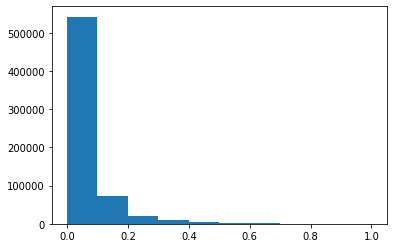

In [15]:
plt.hist(fracs)

(array([  3650.,  57407., 146907., 334236.,  71876.,  19674.,   9612.,
          5848.,   4256.,   1661.]),
 array([0.e+00, 1.e-04, 1.e-03, 1.e-02, 1.e-01, 2.e-01, 3.e-01, 4.e-01,
        5.e-01, 7.e-01, 1.e+00]),
 <BarContainer object of 10 artists>)

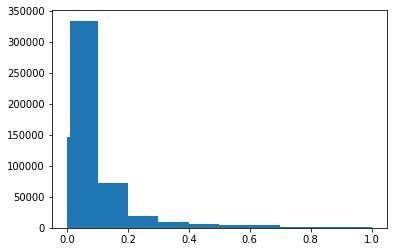

In [21]:
plt.hist(fracs, bins=[0, 1e-4, 1e-3, 2e-3, 4e-3, 6e-3, 8e-3, 1e-2, 2e-2, 3e-2, 0.1, 0.2, 0.3, 0.4, 0.5, 0.7, 1.0])

(array([207964.,  81789.,  63638.,  50035.,  39663.,  29989.,  32923.,
         36199.,  71876.,  19674.,   9612.,   5848.,   2918.,   1338.,
           705.,    446.,    510.]),
 array([0.   , 0.01 , 0.02 , 0.03 , 0.04 , 0.05 , 0.06 , 0.075, 0.1  ,
        0.2  , 0.3  , 0.4  , 0.5  , 0.6  , 0.7  , 0.8  , 0.9  , 1.   ]),
 <BarContainer object of 17 artists>)

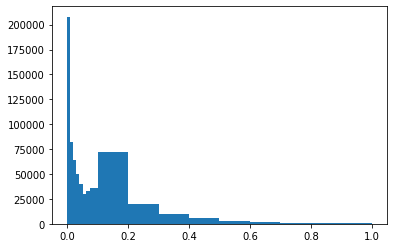

In [22]:
plt.hist(fracs, bins=[0.0,0.01,0.02,0.03,0.04,0.05,0.06,0.075,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1])

(array([38267., 22790., 72103., 41715., 33089., 81789., 63638., 50035.,
        39663., 29989., 32923., 36199., 71876., 19674.,  9612.,  5848.,
         4256.,  1661.]),
 array([0.0e+00, 5.0e-04, 1.0e-03, 4.0e-03, 7.0e-03, 1.0e-02, 2.0e-02,
        3.0e-02, 4.0e-02, 5.0e-02, 6.0e-02, 7.5e-02, 1.0e-01, 2.0e-01,
        3.0e-01, 4.0e-01, 5.0e-01, 7.0e-01, 1.0e+00]),
 <BarContainer object of 18 artists>)

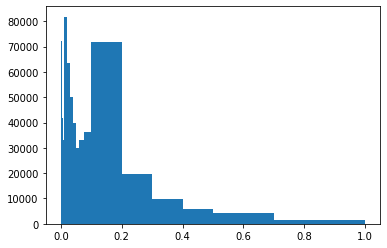

In [29]:
plt.hist(fracs, bins=[0.0,5e-4,1e-3,4e-3,7e-3,0.01,0.02,0.03,0.04,0.05,0.06,0.075,0.1,0.2,0.3,0.4,0.5,0.7,1])

In [27]:
len([0.0,5e-4,1e-3,5e-3,0.01,0.02,0.03,0.04,0.05,0.06,0.075,0.1,0.2,0.3,0.4,0.5,0.7,1])

18

In [6]:
import pickle
ds = pickle.load(open('/n/home11/abanerjee/dataset_cache.pkl','rb'))
bins=[0.0,5e-4,1e-3,4e-3,7e-3,0.01,0.02,0.03,0.04,0.05,0.06,0.075,0.1,0.2,0.3,0.4,0.5,0.7,1]
bins_cache = [[] for _ in range(len(bins)-1)]

In [7]:
for (roi,idx,frac) in ds:
    for i,bin in enumerate(bins[1:]):
        if bin>frac:
            bins_cache[i].append([roi, idx])
            break

In [3]:
len(bins_cache)

18

In [9]:
len(bins_cache[0]),len(bins_cache[1])

(38267, 22790)

In [10]:
pickle.dump(bins_cache, open('/n/home11/abanerjee/pytorch_connectomics/notebooks/bins_cache.pkl','wb'))